In [ ]:
#install packages in terminal: matplotlib, numpy, pandas
#loading libraries 1
import pandas as pd
from pandas import read_csv
from pandas import DataFrame, Series
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import numpy as np
from tabulate import tabulate
import seaborn as sns
from IPython.display import display
from sklearn.tree import plot_tree

#loading libraries 2
# Step 2 - Load mroe libraries

#Tools for model selection
from sklearn.model_selection import train_test_split
#Split array or matrices into random train and test subsets

from sklearn.model_selection import KFold
# divides all the samples into random training and test subsets

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
# evaluate a score by cross-validation
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix

#Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC


In [ ]:
#Loading the dataset
filename = 'raw_data.csv'

data_types = {
    'Weekday': 'int32',
    'ON_OFF': 'category',
    'HE': 'int32',
    'PJMC_RT_LMP': 'float64',
    'PJMC_RT_CONG': 'float64',
    'PJMC_DA_LMP': 'float64',
    'PJMC_DA_CONG': 'float64',
    'MISO_RT_LMP': 'float64',
    'MISO_RT_CONG': 'float64',
    'MISO_DA_LMP': 'float64',
    'MISO_DA_CONG': 'float64',
    'MISO_RTLOAD': 'float64',
    'MISO_LOAD_FC': 'float64',
    'Central_RT_LOAD': 'float64',
    'Central_LOAD_FC': 'float64',
    'MISO_GAS_GEN': 'float64',
    'MISO_DA_GAS': 'float64',
    'MISO_COAL_GEN': 'float64',
    'MISO_DA_COAL': 'float64',
    'MISO_Nuclear_Gen': 'float64',
    'MISO_Nuclear_DA': 'float64',
    'MISO_Hydro_Gen': 'float64',
    'MIS_DA_Hydro': 'float64',
    'PJM_RTLOAD': 'float64',
    'PJM_LOAD_FC': 'float64',
    'PJM_West_LOAD': 'float64',
    'PJM_West_LOAD_FC': 'float64',
    'PJM_GAS_Gen': 'float64',
    'PJM_Coal_Gen': 'float64',
    'PJM_Nuclear_Gen': 'float64',
    'PJM_Hydro_Gen': 'float64',
    'PJM_Ramp_Imports': 'float64',
    'PJM_Ramp_Exports': 'float64',
    'MISO_Ramp_Imports': 'float64',
    'MISO_Ramp_Exports': 'float64',
    'MISO_ACE': 'float64',
    'PJM_ACE': 'float64',
    'MISO_PJMC_DALMP': 'float64',
    'MISO_PJMC_RTLMP': 'float64',
    'MISO_PJMC_DA_CONG': 'float64',
    'MISO_PJMC_RT_CONG': 'float64',
    'PJM_MISO_RT_LOAD': 'float64',
    'MISO_Net_Load': 'float64',
    'PJM_Net_Load': 'float64',
    'PJM_MISO_Net_Load': 'float64'
}

names = [
    'Weekday', 'ON_OFF', 'HE', 'DATE', 'Date_Time',
    'PJMC_RT_LMP', 'PJMC_RT_CONG', 'PJMC_DA_LMP', 'PJMC_DA_CONG',
    'MISO_RT_LMP', 'MISO_RT_CONG', 'MISO_DA_LMP', 'MISO_DA_CONG',
    'MISO_RTLOAD', 'MISO_LOAD_FC', 'Central_RT_LOAD', 'Central_LOAD_FC',
    'MISO_GAS_GEN', 'MISO_DA_GAS', 'MISO_COAL_GEN', 'MISO_DA_COAL',
    'MISO_Nuclear_Gen', 'MISO_Nuclear_DA', 'MISO_Hydro_Gen', 'MIS_DA_Hydro',
    'PJM_RTLOAD', 'PJM_LOAD_FC', 'PJM_West_LOAD', 'PJM_West_LOAD_FC',
    'PJM_GAS_Gen', 'PJM_Coal_Gen', 'PJM_Nuclear_Gen', 'PJM_Hydro_Gen',
    'PJM_Ramp_Imports', 'PJM_Ramp_Exports', 'MISO_Ramp_Imports', 'MISO_Ramp_Exports',
    'MISO_ACE', 'PJM_ACE', 'MISO_PJMC_DALMP', 'MISO_PJMC_RTLMP',
    'MISO_PJMC_DA_CONG', 'MISO_PJMC_RT_CONG', 'PJM_MISO_RT_LOAD',
    'MISO_Net_Load', 'PJM_Net_Load', 'PJM_MISO_Net_Load']

dataset = pd.read_csv(filename, names=names, header=0, dtype=data_types, parse_dates=['DATE', 'Date_Time'])





FileNotFoundError: [Errno 2] No such file or directory: 'raw_data.csv'

In [ ]:
#checking if the dataset is loaded correctly
print(dataset.head(20))
print(dataset.shape)
print(dataset.dtypes)


In [ ]:
#Data Cleaning
dataset.info()
dataset.isnull().sum()

#remove all rows with missing values
dataset = dataset.dropna()
dataset.isnull().sum() #Check if there is any missing value left

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43873 entries, 0 to 43872
Data columns (total 47 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Weekday            43873 non-null  int32         
 1   ON_OFF             43873 non-null  category      
 2   HE                 43873 non-null  int32         
 3   DATE               43873 non-null  datetime64[ns]
 4   Date_Time          43873 non-null  datetime64[ns]
 5   PJMC_RT_LMP        43873 non-null  float64       
 6   PJMC_RT_CONG       43873 non-null  float64       
 7   PJMC_DA_LMP        43873 non-null  float64       
 8   PJMC_DA_CONG       43873 non-null  float64       
 9   MISO_RT_LMP        43873 non-null  float64       
 10  MISO_RT_CONG       43873 non-null  float64       
 11  MISO_DA_LMP        43873 non-null  float64       
 12  MISO_DA_CONG       43873 non-null  float64       
 13  MISO_RTLOAD        43872 non-null  float64       
 14  MISO_L

,0
Weekday,0
ON_OFF,0
HE,0
DATE,0
Date_Time,0
PJMC_RT_LMP,0
PJMC_RT_CONG,0
PJMC_DA_LMP,0
PJMC_DA_CONG,0
MISO_RT_LMP,0


## Convert numeric columns with commas to float and Visualize outliers with boxplot (Esther)


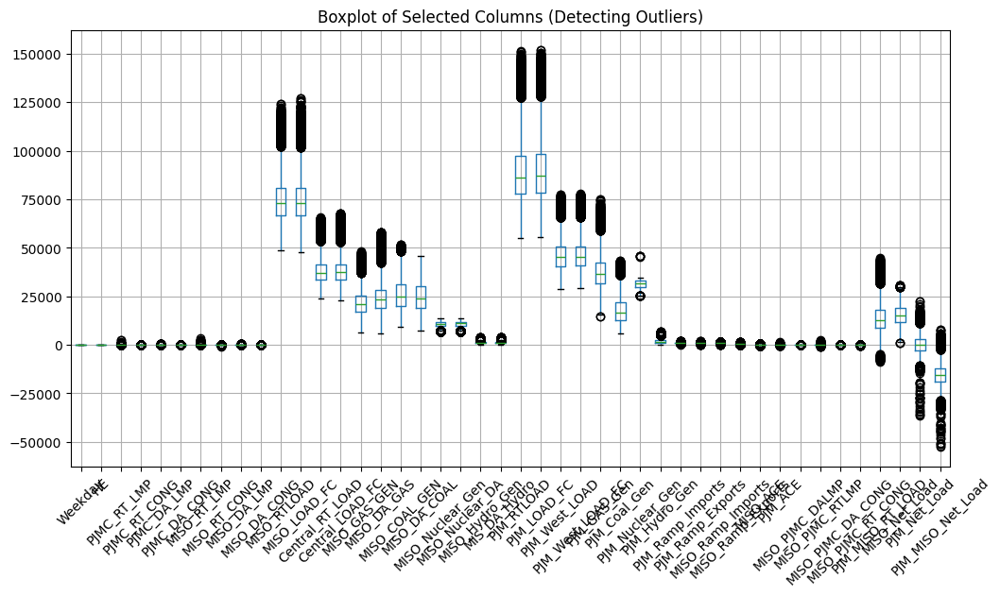

In [ ]:
# Convert numeric columns with commas to float
numeric_columns = [
    'PJMC_RT_LMP', 'MISO_RT_LMP', 'MISO_RTLOAD', 'Central_RT_LOAD',
    'MISO_ACE', 'PJM_ACE', 'PJM_MISO_RT_LOAD', 'MISO_Net_Load',
    'PJM_Net_Load', 'PJM_MISO_Net_Load'
]

#Visualize outliers with boxplot
plt.figure(figsize=(12, 6))
dataset.boxplot()
plt.xticks(rotation=45)
plt.title("Boxplot of Selected Columns (Detecting Outliers)")
plt.show()

## Compute IQR to detect outliers and Define lower and upper bounds (Esther)

In [ ]:
#Compute IQR to detect outliers
numeric_dataset = dataset.select_dtypes(include=[np.number])

Q1 = numeric_dataset.quantile(0.25)
Q3 = numeric_dataset.quantile(0.75)
IQR = Q3 - Q1

display(IQR)

,0
Weekday,4.0000
HE,11.0000
PJMC_RT_LMP,19.3300
PJMC_RT_CONG,0.4500
PJMC_DA_LMP,20.4825
PJMC_DA_CONG,1.2000
MISO_RT_LMP,21.2625
MISO_RT_CONG,1.9600
MISO_DA_LMP,21.0500
MISO_DA_CONG,2.3200


In [ ]:
# Define lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers_iqr = (numeric_dataset < lower_bound) | (numeric_dataset > upper_bound)
print(outliers_iqr.sum())

Weekday                  0
HE                       0
PJMC_RT_LMP           3703
PJMC_RT_CONG         13803
PJMC_DA_LMP           3028
PJMC_DA_CONG          7061
MISO_RT_LMP           3177
MISO_RT_CONG          8709
MISO_DA_LMP           2859
MISO_DA_CONG          5406
MISO_RTLOAD           1428
MISO_LOAD_FC          1591
Central_RT_LOAD       1374
Central_LOAD_FC       1524
MISO_GAS_GEN           729
MISO_DA_GAS            946
MISO_COAL_GEN          141
MISO_DA_COAL             0
MISO_Nuclear_Gen       562
MISO_Nuclear_DA        835
MISO_Hydro_Gen        3877
MIS_DA_Hydro          4538
PJM_RTLOAD            1122
PJM_LOAD_FC           1140
PJM_West_LOAD          897
PJM_West_LOAD_FC       917
PJM_GAS_Gen           1463
PJM_Coal_Gen           743
PJM_Nuclear_Gen         34
PJM_Hydro_Gen         1485
PJM_Ramp_Imports      1075
PJM_Ramp_Exports      1075
MISO_Ramp_Imports     1104
MISO_Ramp_Exports     1104
MISO_ACE              1594
PJM_ACE               1431
MISO_PJMC_DALMP       3750
M

In [ ]:
print(dataset['ON_OFF'].value_counts()) # Check the number of On and Off Peaks

#Transform and Group Data by day of the Week
def day_of_week(x):
    if x >= 1 and x <= 5:
        return 'Weekday'
    else:
        return 'Weekend'

dataset['Day_Type'] = dataset['Weekday'].apply(day_of_week)


#group MISO & PJMC LMP price based
LMP_daytype = dataset.groupby(['ON_OFF','Day_Type'])[['PJMC_RT_LMP','MISO_RT_LMP']].agg([min,max])

display(LMP_daytype)

ON_OFF
ON     29191
OFF    14581
Name: count, dtype: int64


<ipython-input-7-38929fba6169>:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  LMP_daytype = dataset.groupby(['ON_OFF','Day_Type'])[['PJMC_RT_LMP','MISO_RT_LMP']].agg([min,max])
<ipython-input-7-38929fba6169>:14: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  LMP_daytype = dataset.groupby(['ON_OFF','Day_Type'])[['PJMC_RT_LMP','MISO_RT_LMP']].agg([min,max])
<ipython-input-7-38929fba6169>:14: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" inst

PJMC_RT_LMP          MISO_RT_LMP         
                        min      max         min      max
ON_OFF Day_Type                                          
OFF    Weekday       -20.18   432.03      -21.28   459.36
       Weekend       -22.76   312.69      -13.59  2540.00
ON     Weekday       -45.62  2213.58      -88.93  3430.14
       Weekend        -6.53   917.37      -81.14  1048.36

In [ ]:
#Transform and Group data by hours of the day
dataset['Date_Time'] = pd.to_datetime(dataset['Date_Time']) #convert the Date_Time column to datetime
dataset['Hour'] = dataset['Date_Time'].dt.hour #extract the hour from the Date_Time column
dataset['Hour'] = dataset['Hour'].astype('int32') #convert the hour to integer

#define funct to categorize the hours of the day
def hour_category(hour):
    if hour >= 6 and hour <= 12:
        return 'Morning'
    elif hour >= 13 and hour <= 18:
        return 'Afternoon'
    elif hour >= 19 and hour <= 23 or hour == 0:
        return 'Evening'
    else:
        return 'Overnight'

dataset['Hour_Category'] = dataset['Hour'].apply(hour_category) #apply the function to the Hour column

hour_on_off = dataset.groupby(['ON_OFF','Hour_Category'])[['PJMC_RT_LMP','MISO_RT_LMP']].agg([np.mean,np.std])
display(hour_on_off)



<ipython-input-8-4e3ae4b8f689>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  hour_on_off = dataset.groupby(['ON_OFF','Hour_Category'])[['PJMC_RT_LMP','MISO_RT_LMP']].agg([np.mean,np.std])
<ipython-input-8-4e3ae4b8f689>:19: FutureWarning: The provided callable <function mean at 0x7cb43ffb53a0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  hour_on_off = dataset.groupby(['ON_OFF','Hour_Category'])[['PJMC_RT_LMP','MISO_RT_LMP']].agg([np.mean,np.std])
<ipython-input-8-4e3ae4b8f689>:19: FutureWarning: The provided callable <function std at 0x7cb43ffb54e0> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To kee

PJMC_RT_LMP            MISO_RT_LMP           
                            mean        std        mean        std
ON_OFF Hour_Category                                              
OFF    Afternoon             NaN        NaN         NaN        NaN
       Evening         29.560344  21.951270   27.732722  17.864182
       Morning         28.248576  19.993587   27.723063  42.438222
       Overnight       25.595877  17.202123   24.998501  47.898183
ON     Afternoon       39.835814  46.024300   40.068845  55.743354
       Evening         42.050720  45.219191   40.406937  52.515611
       Morning         35.877294  33.525199   34.382053  32.197308
       Overnight             NaN        NaN         NaN        NaN

In [ ]:
#Testing to confirm hypothesis that theres no ON/peak during overnight
print(dataset[(dataset['ON_OFF'] == 'ON') & (dataset['Hour_Category'] == 'Overnight')].head(10))

#Testing to confirm hypothesis that theres no OFF/peak during Afternoon
print(dataset[(dataset['ON_OFF'] == 'OFF') & (dataset['Hour_Category'] == 'Afternoon')].head(10))

Empty DataFrame
Columns: [Weekday, ON_OFF, HE, DATE, Date_Time, PJMC_RT_LMP, PJMC_RT_CONG, PJMC_DA_LMP, PJMC_DA_CONG, MISO_RT_LMP, MISO_RT_CONG, MISO_DA_LMP, MISO_DA_CONG, MISO_RTLOAD, MISO_LOAD_FC, Central_RT_LOAD, Central_LOAD_FC, MISO_GAS_GEN, MISO_DA_GAS, MISO_COAL_GEN, MISO_DA_COAL, MISO_Nuclear_Gen, MISO_Nuclear_DA, MISO_Hydro_Gen, MIS_DA_Hydro, PJM_RTLOAD, PJM_LOAD_FC, PJM_West_LOAD, PJM_West_LOAD_FC, PJM_GAS_Gen, PJM_Coal_Gen, PJM_Nuclear_Gen, PJM_Hydro_Gen, PJM_Ramp_Imports, PJM_Ramp_Exports, MISO_Ramp_Imports, MISO_Ramp_Exports, MISO_ACE, PJM_ACE, MISO_PJMC_DALMP, MISO_PJMC_RTLMP, MISO_PJMC_DA_CONG, MISO_PJMC_RT_CONG, PJM_MISO_RT_LOAD, MISO_Net_Load, PJM_Net_Load, PJM_MISO_Net_Load, Day_Type, Hour, Hour_Category]
Index: []

[0 rows x 50 columns]
Empty DataFrame
Columns: [Weekday, ON_OFF, HE, DATE, Date_Time, PJMC_RT_LMP, PJMC_RT_CONG, PJMC_DA_LMP, PJMC_DA_CONG, MISO_RT_LMP, MISO_RT_CONG, MISO_DA_LMP, MISO_DA_CONG, MISO_RTLOAD, MISO_LOAD_FC, Central_RT_LOAD, Central_LOAD_FC, M

In [ ]:
#Outliers Detection for each market - IQR Method

PJMC_market = dataset[['Weekday','ON_OFF','DATE','Date_Time','Hour','Hour_Category','PJMC_RT_LMP','PJMC_RT_CONG'
                       ,'PJMC_DA_LMP','PJMC_DA_CONG','PJM_RTLOAD','PJM_LOAD_FC','PJM_West_LOAD','PJM_West_LOAD_FC','Central_RT_LOAD','Central_LOAD_FC'
                       ,'PJM_Ramp_Imports','PJM_Ramp_Exports','PJM_ACE','PJM_MISO_RT_LOAD','PJM_Net_Load','PJM_MISO_Net_Load']]

MISO_market = dataset[['Weekday','ON_OFF','DATE','Date_Time','Hour','Hour_Category','MISO_RT_LMP','MISO_RT_CONG'
                       ,'MISO_DA_LMP','MISO_DA_CONG','MISO_RTLOAD','MISO_LOAD_FC','PJM_West_LOAD','PJM_West_LOAD_FC','Central_RT_LOAD','Central_LOAD_FC'
                       ,'MISO_Ramp_Imports','MISO_Ramp_Exports','MISO_ACE','MISO_PJMC_RT_CONG','MISO_Net_Load']]
#PJMC_market
q1_PJMC = np.percentile(PJMC_market['PJMC_RT_LMP'], 25)
q3_PJMC = np.percentile(PJMC_market['PJMC_RT_LMP'], 75)
iqr_PJMC = q3_PJMC - q1_PJMC

PJMC_upper_bound = PJMC_market['PJMC_RT_LMP'] >= (q3_PJMC + 1.5 * iqr_PJMC)
PJMC_lower_bound = PJMC_market['PJMC_RT_LMP'] <= (q1_PJMC - 1.5 * iqr_PJMC)

PJMC_outliers = PJMC_market[PJMC_upper_bound|PJMC_lower_bound]
PJMC_no_outliers = PJMC_market[~(PJMC_upper_bound|PJMC_lower_bound)]

#MISO_market
q1_MISO = np.percentile(MISO_market['MISO_RT_LMP'], 25)
q3_MISO = np.percentile(MISO_market['MISO_RT_LMP'], 75)
iqr_MISO = q3_MISO - q1_MISO

MISO_upper_bound = MISO_market['MISO_RT_LMP'] >= (q3_MISO + 1.5 * iqr_MISO)
MISO_lower_bound = MISO_market['MISO_RT_LMP'] <= (q1_MISO - 1.5 * iqr_MISO)

MISO_outliers = MISO_market[MISO_upper_bound|MISO_lower_bound]
MISO_no_outliers = MISO_market[~(MISO_upper_bound|MISO_lower_bound)]

,PJMC_RT_LMP,MISO_RT_LMP
count,43772.00,43772.00
mean,35.00,34.14
std,36.39,46.62
min,-45.62,-88.93
25%,19.84,18.35
50%,25.02,24.77
75%,39.17,39.61
max,2213.58,3430.14


   PJMC_RT_LMP  MISO_RT_LMP
0        20.27        21.13
PJMC_RT_LMP    25.02
MISO_RT_LMP    24.77
dtype: float64
PJMC_RT_LMP    16.95
MISO_RT_LMP    32.07
dtype: float64


<ipython-input-11-0752045b704c>:14: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(dataset['PJMC_RT_LMP'], shade=True)


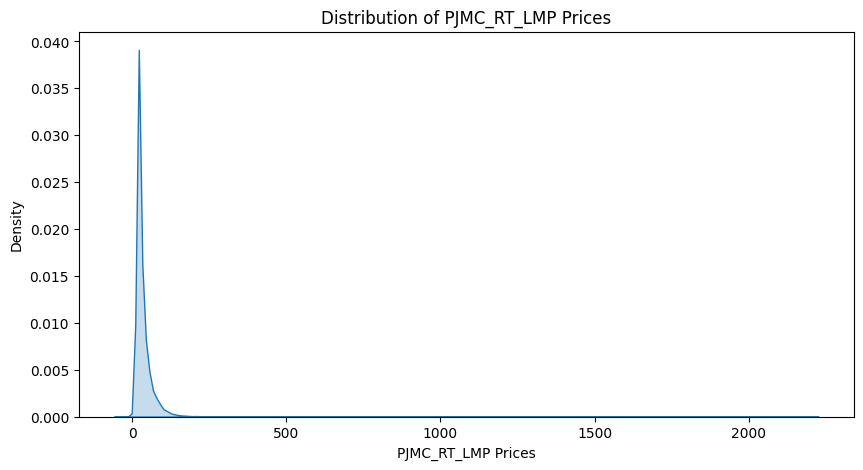

<ipython-input-11-0752045b704c>:22: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(dataset['MISO_RT_LMP'], shade=True)


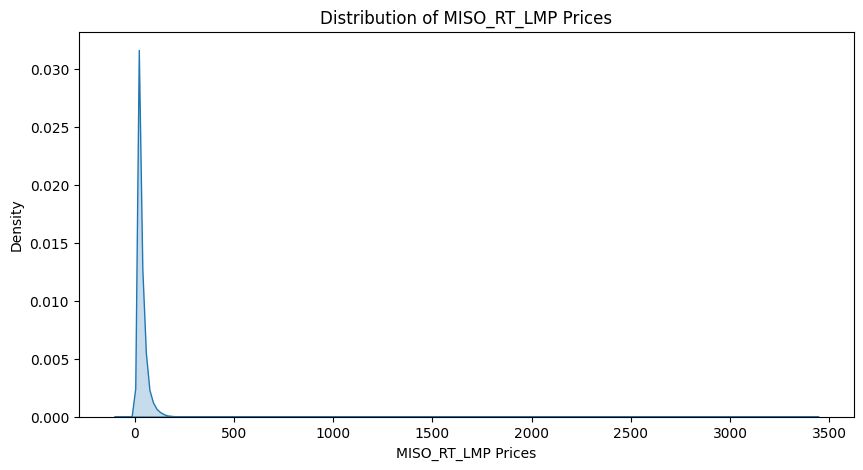

In [ ]:
#Distribution of PJMC and MISO LMP prices

#Summary of descriptive statistics
pd.set_option('display.precision', 2)
lmp_description = dataset[['PJMC_RT_LMP', 'MISO_RT_LMP']].describe()
display(lmp_description)

print(dataset[['PJMC_RT_LMP', 'MISO_RT_LMP']].mode())
print(dataset[['PJMC_RT_LMP', 'MISO_RT_LMP']].median())
print(dataset[['PJMC_RT_LMP', 'MISO_RT_LMP']].skew())

#Plot distribution for 'PJMC_RT_LMP'
plt.figure(figsize=(10, 5))
sns.kdeplot(dataset['PJMC_RT_LMP'], shade=True)
plt.xlabel('PJMC_RT_LMP Prices')
plt.ylabel('Density')
plt.title('Distribution of PJMC_RT_LMP Prices')
plt.show()

# Plot distribution for 'MISO_RT_LMP'
plt.figure(figsize=(10, 5))
sns.kdeplot(dataset['MISO_RT_LMP'], shade=True)
plt.xlabel('MISO_RT_LMP Prices')
plt.ylabel('Density')
plt.title('Distribution of MISO_RT_LMP Prices')
plt.show()

In [ ]:
#Distribution of PJMC and MISO Real Time Loads
pd.set_option('display.precision', 2)
load_description = dataset[['PJM_RTLOAD', 'MISO_RTLOAD']].describe()
display(load_description)

print(dataset[['PJM_RTLOAD', 'MISO_RTLOAD']].mode())
print(dataset[['PJM_RTLOAD', 'MISO_RTLOAD']].median())
print(dataset[['PJM_RTLOAD', 'MISO_RTLOAD']].skew())

,PJM_RTLOAD,MISO_RTLOAD
count,43772.00,43772.00
mean,88792.35,75020.53
std,15819.58,11861.81
min,54936.83,48827.33
25%,77657.07,66670.52
50%,86317.45,73226.95
75%,97553.31,80964.22
max,151570.04,124229.33


   PJM_RTLOAD  MISO_RTLOAD
0    85799.14     62998.62
1   103388.58     67627.20
2         NaN     68413.89
3         NaN     78336.60
PJM_RTLOAD     86317.45
MISO_RTLOAD    73226.95
dtype: float64
PJM_RTLOAD     0.79
MISO_RTLOAD    0.85
dtype: float64


## Grouping data by month and categorize into seasons (Lynn)


In [ ]:
# Group data by month
dataset['Month'] = dataset['Date_Time'].dt.month  # Extract the month from the Date_Time column

# Define a function to categorize months into seasons
def month_category(month):
    if month in [12,1,2]:
        return 'Winter'
    elif month in [3,4,5]:
        return 'Spring'
    elif month in [6,7,8]:
        return 'Summer'
    else:
        return 'Fall'

# Apply the function to create season column
dataset['Season'] = dataset['Month'].apply(month_category)

## Adding Columns: LMP Price Difference (Real-Time vs. Day-Ahead) and Statistic Table for those two column (Lynn)


In [ ]:
# Add new columns to calculate difference between Real-time LMP and Day-ahead LMP to measure forecasting error
dataset['PJM_LMP_Diff'] = dataset['PJMC_RT_LMP'] - dataset['PJMC_DA_LMP']
dataset['MISO_LMP_Diff'] = dataset['MISO_RT_LMP'] - dataset['MISO_DA_LMP']

dataset.head()

,Weekday,ON_OFF,HE,DATE,Date_Time,PJMC_RT_LMP,PJMC_RT_CONG,PJMC_DA_LMP,PJMC_DA_CONG,MISO_RT_LMP,...,MISO_Net_Load,PJM_Net_Load,PJM_MISO_Net_Load,Day_Type,Hour,Hour_Category,Month,Season,PJM_LMP_Diff,MISO_LMP_Diff
0,4,OFF,1,2019-05-30,2019-05-30 01:00:00,21.26,0.0,20.92,0.56,17.48,...,10491.66,-4919.29,-15410.95,Weekday,1,Overnight,5,Spring,0.34,-0.94
1,4,OFF,2,2019-05-30,2019-05-30 02:00:00,20.18,0.0,20.48,-0.05,18.42,...,11198.60,-5514.46,-16713.06,Weekday,2,Overnight,5,Spring,-0.30,0.47
2,4,OFF,3,2019-05-30,2019-05-30 03:00:00,19.28,0.0,19.34,-0.21,18.60,...,12170.31,-8015.65,-20185.96,Weekday,3,Overnight,5,Spring,-0.06,1.10
3,4,OFF,4,2019-05-30,2019-05-30 04:00:00,19.31,0.0,18.96,-0.12,17.67,...,11703.99,-9397.73,-21101.72,Weekday,4,Overnight,5,Spring,0.35,1.23
4,4,OFF,5,2019-05-30,2019-05-30 05:00:00,18.98,0.0,19.04,-0.17,18.43,...,11795.56,-9037.81,-20833.38,Weekday,5,Overnight,5,Spring,-0.06,1.74


In [ ]:
# Generate Summary Statistics for LMP Price Difference
dataset[['PJM_LMP_Diff','MISO_LMP_Diff']].describe(percentiles = [0.05, 0.25, 0.5, 0.75, 0.95])

,PJM_LMP_Diff,MISO_LMP_Diff
count,43772.00,43772.00
mean,-0.57,-0.28
std,28.96,39.71
min,-196.98,-273.01
5%,-16.42,-17.08
25%,-5.45,-5.26
50%,-1.95,-1.47
75%,0.44,1.41
95%,15.07,16.74
max,2105.50,3272.79


## Adding Columns: Net Export (Numerical & Categorical columns) and these distribution in different seasons (Lynn)


In [ ]:
# Calculate Net Exports (Ramp Exports - Ramp Imports)
# Net Exports measure whether the market is importing or exporting electricity.
dataset['PJM_Net_Exports'] = dataset['PJM_Ramp_Exports'] - dataset['PJM_Ramp_Imports']
dataset['MISO_Net_Exports'] = dataset['MISO_Ramp_Exports'] - dataset['MISO_Ramp_Imports']

dataset.head()

,Weekday,ON_OFF,HE,DATE,Date_Time,PJMC_RT_LMP,PJMC_RT_CONG,PJMC_DA_LMP,PJMC_DA_CONG,MISO_RT_LMP,...,PJM_MISO_Net_Load,Day_Type,Hour,Hour_Category,Month,Season,PJM_LMP_Diff,MISO_LMP_Diff,PJM_Net_Exports,MISO_Net_Exports
0,4,OFF,1,2019-05-30,2019-05-30 01:00:00,21.26,0.0,20.92,0.56,17.48,...,-15410.95,Weekday,1,Overnight,5,Spring,0.34,-0.94,157.5,-605.0
1,4,OFF,2,2019-05-30,2019-05-30 02:00:00,20.18,0.0,20.48,-0.05,18.42,...,-16713.06,Weekday,2,Overnight,5,Spring,-0.30,0.47,-1261.0,930.5
2,4,OFF,3,2019-05-30,2019-05-30 03:00:00,19.28,0.0,19.34,-0.21,18.60,...,-20185.96,Weekday,3,Overnight,5,Spring,-0.06,1.10,269.0,-611.5
3,4,OFF,4,2019-05-30,2019-05-30 04:00:00,19.31,0.0,18.96,-0.12,17.67,...,-21101.72,Weekday,4,Overnight,5,Spring,0.35,1.23,24.0,-484.5
4,4,OFF,5,2019-05-30,2019-05-30 05:00:00,18.98,0.0,19.04,-0.17,18.43,...,-20833.38,Weekday,5,Overnight,5,Spring,-0.06,1.74,179.5,-792.5


In [ ]:
# Categorize Net Export Status
# This function classifies Net Exports into three categories:
# - "Net Exporter" if exports exceed imports by 1000 MW or more
# - "Net Importer" if imports exceed exports by 1000 MW or more
# - "Balanced" if the difference is within ±1000 MW

def categorize_exports(value):
    if value > 1000:
        return "Net Exporter"
    elif value < -1000:
        return "Net Importer"
    else:
        return "Balanced"

dataset['PJM_Export_Status'] = dataset['PJM_Net_Exports'].apply(categorize_exports)
dataset['MISO_Export_Status'] = dataset['MISO_Net_Exports'].apply(categorize_exports)
dataset.head()

,Weekday,ON_OFF,HE,DATE,Date_Time,PJMC_RT_LMP,PJMC_RT_CONG,PJMC_DA_LMP,PJMC_DA_CONG,MISO_RT_LMP,...,Hour,Hour_Category,Month,Season,PJM_LMP_Diff,MISO_LMP_Diff,PJM_Net_Exports,MISO_Net_Exports,PJM_Export_Status,MISO_Export_Status
0,4,OFF,1,2019-05-30,2019-05-30 01:00:00,21.26,0.0,20.92,0.56,17.48,...,1,Overnight,5,Spring,0.34,-0.94,157.5,-605.0,Balanced,Balanced
1,4,OFF,2,2019-05-30,2019-05-30 02:00:00,20.18,0.0,20.48,-0.05,18.42,...,2,Overnight,5,Spring,-0.30,0.47,-1261.0,930.5,Net Importer,Balanced
2,4,OFF,3,2019-05-30,2019-05-30 03:00:00,19.28,0.0,19.34,-0.21,18.60,...,3,Overnight,5,Spring,-0.06,1.10,269.0,-611.5,Balanced,Balanced
3,4,OFF,4,2019-05-30,2019-05-30 04:00:00,19.31,0.0,18.96,-0.12,17.67,...,4,Overnight,5,Spring,0.35,1.23,24.0,-484.5,Balanced,Balanced
4,4,OFF,5,2019-05-30,2019-05-30 05:00:00,18.98,0.0,19.04,-0.17,18.43,...,5,Overnight,5,Spring,-0.06,1.74,179.5,-792.5,Balanced,Balanced


In [ ]:
# Checking Net Export Status Distribution (e.g.more often net exporters or importers)
print(dataset['PJM_Export_Status'].value_counts())
print(dataset['MISO_Export_Status'].value_counts())

PJM_Export_Status
Balanced        43614
Net Importer      112
Net Exporter       46
Name: count, dtype: int64
MISO_Export_Status
Balanced        42830
Net Importer      930
Net Exporter       12
Name: count, dtype: int64


In [ ]:
# Check average net exports for PJM and MISO in different seasons
dataset.groupby('Season')[['PJM_Net_Exports', 'MISO_Net_Exports']].mean()

,PJM_Net_Exports,MISO_Net_Exports
Season,,
Fall,0.53,-497.87
Spring,-0.34,-496.53
Summer,-0.40,-496.20
Winter,0.12,-496.88


## Mean median and mode for 'PJMC RT LMP', 'MISO RT LMP' (Renee)


Analyzing the following columns: ['PJMC_RT_LMP', 'MISO_RT_LMP']

Statistical Results:

Statistics for PJMC_RT_LMP:
  Mean: 35.002940007310606
  Median: 25.02
  Mode: 20.27
  Standard Deviation: 36.38617067001394
  Variance: 1323.9534160273824
  Range: 2259.2
  Interquartile Range: 19.330000000000002
  Skewness: 16.952058123665324

Statistics for MISO_RT_LMP:
  Mean: 34.13661975692224
  Median: 24.77
  Mode: 21.13
  Standard Deviation: 46.624246303963844
  Variance: 2173.820343412686
  Range: 3519.0699999999997
  Interquartile Range: 21.262499999999996
  Skewness: 32.074350687880255


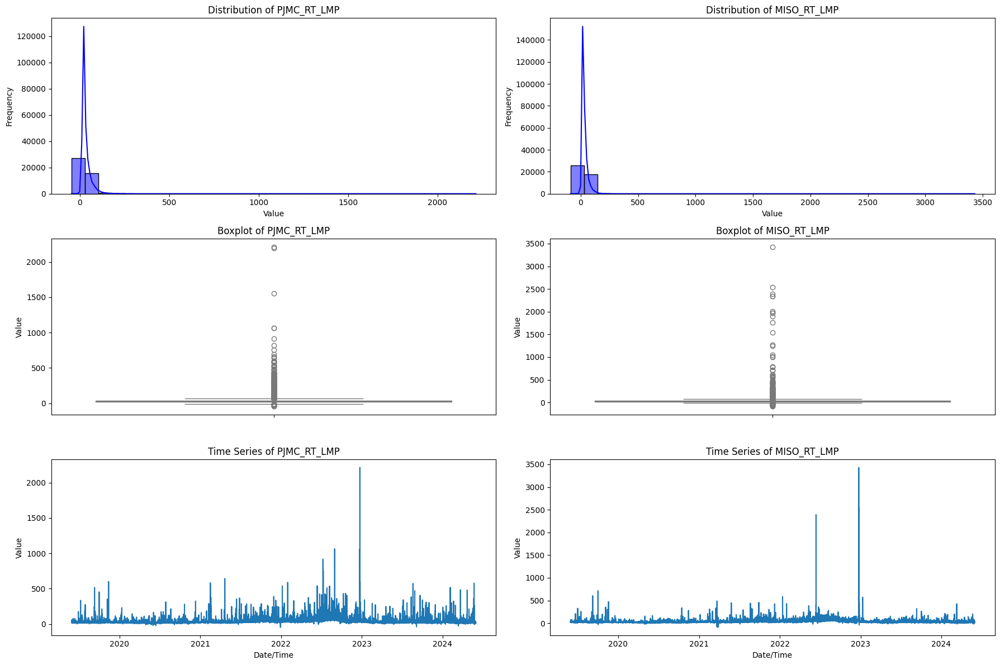

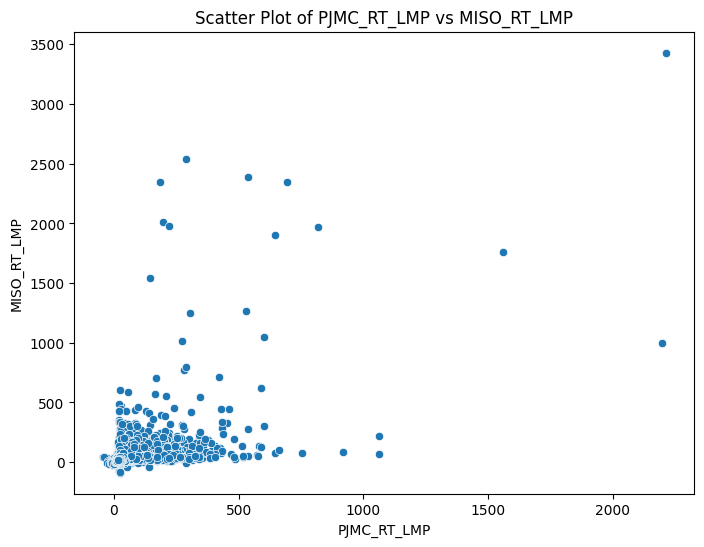

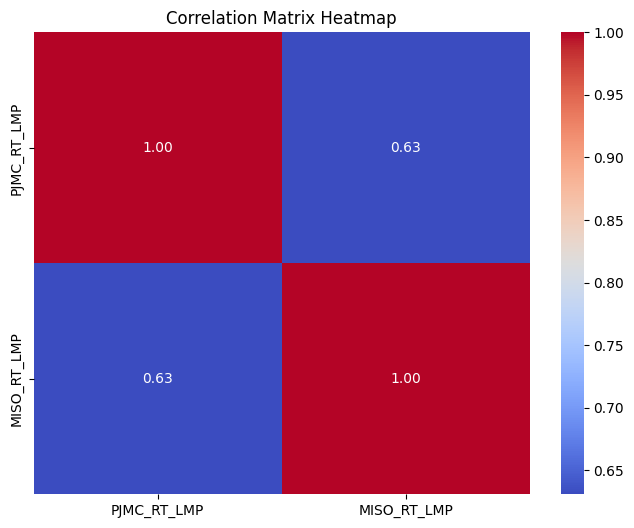

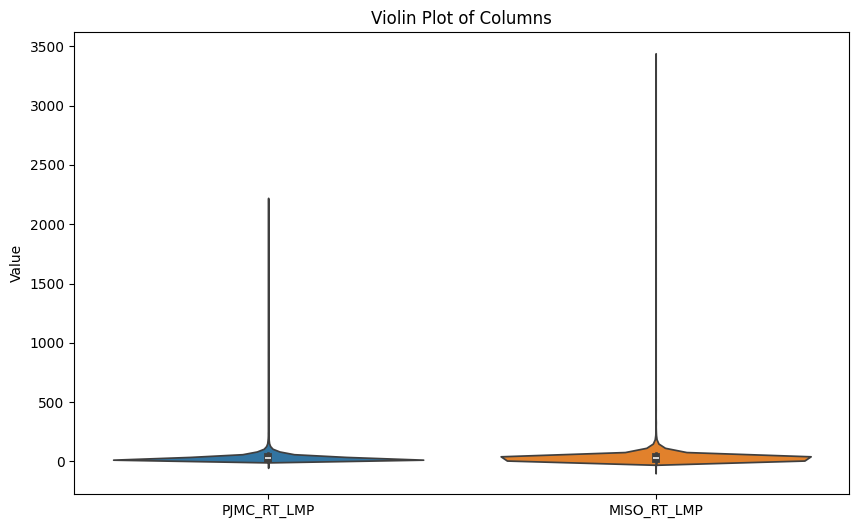

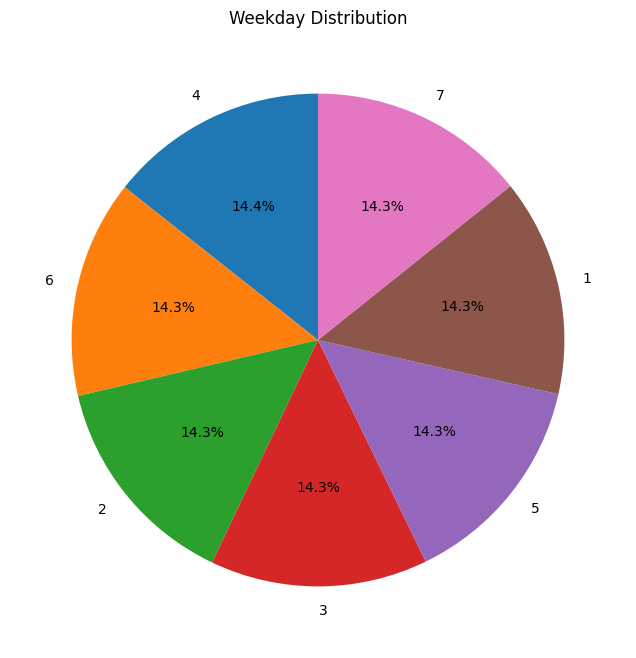

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.precision', 2)
columns_to_analyze = ['PJMC_RT_LMP', 'MISO_RT_LMP']
results = {}
available_columns = [col for col in columns_to_analyze if col in dataset.columns]
if not available_columns:
    print("No valid columns to analyze.")
else:
    print(f"Analyzing the following columns: {available_columns}")
    for col in available_columns:
        dataset[col] = pd.to_numeric(dataset[col], errors='coerce')
    # delete missing values
    dataset.dropna(subset=available_columns, inplace=True)
    for col in available_columns:
        data = dataset[col]
        results[col] = {
            'Mean': np.mean(data),  # Calculating for the mean
            'Median': np.median(data),  # Calculating for the median
            'Mode': data.mode().values[0] if not data.mode().empty else None,  # Calculating for the mode
            'Standard Deviation': np.std(data),  # Calculating for standard deviation
            'Variance': np.var(data),  # Calculating for variance
            'Range': np.max(data) - np.min(data),  # Calculating for the range
            'Interquartile Range': np.percentile(data, 75) - np.percentile(data, 25),  # Calculating for IQR
            'Skewness': data.skew()  # Calculating for skewness
        }
    if results:
        print("\nStatistical Results:")
        for col, stats in results.items():
            print(f"\nStatistics for {col}:")
            for stat, value in stats.items():
                print(f"  {stat}: {value}")

    #
    if results:
        plt.figure(figsize=(18, 12))
        # histogram
        for i, col in enumerate(available_columns):
            plt.subplot(3, len(available_columns), i + 1)
            sns.histplot(dataset[col], kde=True, bins=30, color='blue')
            plt.title(f'Distribution of {col}')
            plt.xlabel('Value')
            plt.ylabel('Frequency')
        # Box plots
        for i, col in enumerate(available_columns):
            plt.subplot(3, len(available_columns), len(available_columns) + i + 1)
            sns.boxplot(y=dataset[col], color='lightblue')
            plt.title(f'Boxplot of {col}')
            plt.ylabel('Value')
        # Line chart
        if 'Date_Time' in dataset.columns and not dataset['Date_Time'].empty:
            dataset['Date_Time'] = pd.to_datetime(dataset['Date_Time'])  # 确保日期列为 datetime 类型
            for i, col in enumerate(available_columns):
                plt.subplot(3, len(available_columns), 2 * len(available_columns) + i + 1)
                sns.lineplot(x='Date_Time', y=col, data=dataset)
                plt.title(f'Time Series of {col}')
                plt.xlabel('Date/Time')
                plt.ylabel('Value')
        plt.tight_layout()
        plt.show()
        # Scatter diagram
        if len(available_columns) >= 2:
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=available_columns[0], y=available_columns[1], data=dataset)
            plt.title(f'Scatter Plot of {available_columns[0]} vs {available_columns[1]}')
            plt.xlabel(available_columns[0])
            plt.ylabel(available_columns[1])
            plt.show()
        # correlation graph
        plt.figure(figsize=(8, 6))
        corr_matrix = dataset[available_columns].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title('Correlation Matrix Heatmap')
        plt.show()
        # violin plot
        plt.figure(figsize=(10, 6))
        sns.violinplot(data=dataset[available_columns])
        plt.title('Violin Plot of Columns')
        plt.ylabel('Value')
        plt.show()
        # pie chart
        if 'Weekday' in dataset.columns:
            weekday_counts = dataset['Weekday'].value_counts()
            plt.figure(figsize=(8, 8))
            plt.pie(weekday_counts, labels=weekday_counts.index, autopct='%1.1f%%', startangle=90)
            plt.title('Weekday Distribution')
            plt.show()

##Anomalies for both markets

In [ ]:
# Convert Date_Time column to datetime format
dataset["Date_Time"] = pd.to_datetime(dataset["Date_Time"], errors="coerce")

# Sort by Date_Time
dataset = dataset.sort_values(by="Date_Time").reset_index(drop=True)

# Convert Real-Time Load and Forecasted Load to numeric (handling commas)
dataset["RTLOAD"] = pd.to_numeric(dataset["PJM_RTLOAD"].astype(str).str.replace(",", ""), errors="coerce")
dataset["LOAD_FC"] = pd.to_numeric(dataset["PJM_LOAD_FC"].astype(str).str.replace(",", ""), errors="coerce")

# Compute the difference for PJMC and MISO
dataset["PJMC_Difference"] = dataset["RTLOAD"] - dataset["LOAD_FC"]
dataset['MISO_Difference'] = dataset['MISO_RTLOAD'] - dataset['MISO_LOAD_FC']

# Compute rolling mean and standard deviation for PJMC (based on last 24 hours)
dataset["PJMC_Rolling_Mean"] = dataset["PJMC_Difference"].rolling(window=24, min_periods=12).mean()
dataset["PJMC_Rolling_Std"] = dataset["PJMC_Difference"].rolling(window=24, min_periods=12).std()

# Compute rolling Z-score for PJMC
dataset["PJMC_Rolling_Zscore"] = (dataset["PJMC_Difference"] - dataset["PJMC_Rolling_Mean"]) / dataset["PJMC_Rolling_Std"]

# Use a dynamic threshold based on the 97.5th percentile
threshold = dataset["PJMC_Rolling_Zscore"].quantile(0.975)  # Top 2.5% extreme values
dataset["PJMC_Anomaly"] = np.where(dataset["PJMC_Rolling_Zscore"] > threshold, "Surge",
                         np.where(dataset["PJMC_Rolling_Zscore"] < -threshold, "Drop", "Normal"))

#Compure rolling mean and standard deviation for MISO (based on last 24 hours)
dataset["MISO_Rolling_Mean"] = dataset["MISO_Difference"].rolling(window=24, min_periods=12).mean()
dataset["MISO_Rolling_Std"] = dataset["MISO_Difference"].rolling(window=24, min_periods=12).std()

#compute rolling Z-score for MISO
dataset["MISO_Rolling_Zscore"] = (dataset["MISO_Difference"] - dataset["MISO_Rolling_Mean"]) / dataset["MISO_Rolling_Std"]

#Use a dynamic threshold based on the 97.5th percentile
threshold = dataset["MISO_Rolling_Zscore"].quantile(0.975) #Top 2.5% extreme values % $ $
dataset["MISO_Anomaly"] = np.where(dataset["MISO_Rolling_Zscore"] > threshold, "Surge",
                         np.where(dataset["MISO_Rolling_Zscore"] < -threshold, "Drop", "Normal"))


display(dataset.head(20))


,Weekday,ON_OFF,HE,DATE,Date_Time,PJMC_RT_LMP,PJMC_RT_CONG,PJMC_DA_LMP,PJMC_DA_CONG,MISO_RT_LMP,...,PJMC_Difference,MISO_Difference,PJMC_Rolling_Mean,PJMC_Rolling_Std,PJMC_Rolling_Zscore,PJMC_Anomaly,MISO_Rolling_Mean,MISO_Rolling_Std,MISO_Rolling_Zscore,MISO_Anomaly
0,4,OFF,1,2019-05-30,2019-05-30 01:00:00,21.26,0.0,20.92,0.56,17.48,...,-880.79,-1568.12,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
1,4,OFF,2,2019-05-30,2019-05-30 02:00:00,20.18,0.0,20.48,-0.05,18.42,...,-839.66,-1965.25,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
2,4,OFF,3,2019-05-30,2019-05-30 03:00:00,19.28,0.0,19.34,-0.21,18.60,...,-662.85,-2149.14,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
3,4,OFF,4,2019-05-30,2019-05-30 04:00:00,19.31,0.0,18.96,-0.12,17.67,...,-583.93,-2227.66,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
4,4,OFF,5,2019-05-30,2019-05-30 05:00:00,18.98,0.0,19.04,-0.17,18.43,...,-587.01,-2103.52,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
5,4,OFF,6,2019-05-30,2019-05-30 06:00:00,19.69,0.0,19.20,-0.40,20.99,...,-532.68,-1697.67,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
6,4,OFF,7,2019-05-30,2019-05-30 07:00:00,20.49,0.0,20.56,-0.87,21.13,...,-649.94,-1669.26,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
7,4,ON,8,2019-05-30,2019-05-30 08:00:00,22.12,0.0,22.00,-0.65,21.67,...,-1023.95,-1217.26,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
8,4,ON,9,2019-05-30,2019-05-30 09:00:00,23.82,0.0,23.38,-0.14,24.07,...,-361.04,-1004.82,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
9,4,ON,10,2019-05-30,2019-05-30 10:00:00,26.67,0.0,22.60,-2.26,24.74,...,-661.78,-899.14,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal


In [ ]:
dataset.info()

display(dataset)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43772 entries, 0 to 43771
Data columns (total 70 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Weekday              43772 non-null  int32         
 1   ON_OFF               43772 non-null  category      
 2   HE                   43772 non-null  int32         
 3   DATE                 43772 non-null  datetime64[ns]
 4   Date_Time            43772 non-null  datetime64[ns]
 5   PJMC_RT_LMP          43772 non-null  float64       
 6   PJMC_RT_CONG         43772 non-null  float64       
 7   PJMC_DA_LMP          43772 non-null  float64       
 8   PJMC_DA_CONG         43772 non-null  float64       
 9   MISO_RT_LMP          43772 non-null  float64       
 10  MISO_RT_CONG         43772 non-null  float64       
 11  MISO_DA_LMP          43772 non-null  float64       
 12  MISO_DA_CONG         43772 non-null  float64       
 13  MISO_RTLOAD          43772 non-

,Weekday,ON_OFF,HE,DATE,Date_Time,PJMC_RT_LMP,PJMC_RT_CONG,PJMC_DA_LMP,PJMC_DA_CONG,MISO_RT_LMP,...,PJMC_Difference,MISO_Difference,PJMC_Rolling_Mean,PJMC_Rolling_Std,PJMC_Rolling_Zscore,PJMC_Anomaly,MISO_Rolling_Mean,MISO_Rolling_Std,MISO_Rolling_Zscore,MISO_Anomaly
0,4,OFF,1,2019-05-30,2019-05-30 01:00:00,21.26,0.00,20.92,0.56,17.48,...,-880.79,-1568.12,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
1,4,OFF,2,2019-05-30,2019-05-30 02:00:00,20.18,0.00,20.48,-0.05,18.42,...,-839.66,-1965.25,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
2,4,OFF,3,2019-05-30,2019-05-30 03:00:00,19.28,0.00,19.34,-0.21,18.60,...,-662.85,-2149.14,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
3,4,OFF,4,2019-05-30,2019-05-30 04:00:00,19.31,0.00,18.96,-0.12,17.67,...,-583.93,-2227.66,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
4,4,OFF,5,2019-05-30,2019-05-30 05:00:00,18.98,0.00,19.04,-0.17,18.43,...,-587.01,-2103.52,NaN,NaN,NaN,Normal,NaN,NaN,NaN,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43767,4,ON,21,2024-05-30,2024-05-30 20:00:00,24.80,0.18,26.40,0.10,45.87,...,-478.66,3576.39,-526.23,123.11,0.39,Normal,1294.83,1805.30,1.26,Normal
43768,4,ON,22,2024-05-30,2024-05-30 21:00:00,25.01,0.13,27.86,-0.38,29.82,...,-541.87,2917.54,-523.70,122.09,-0.15,Normal,1423.67,1806.21,0.83,Normal
43769,4,ON,23,2024-05-30,2024-05-30 22:00:00,22.98,0.08,28.43,-0.09,21.82,...,-545.11,2414.48,-519.02,118.86,-0.22,Normal,1546.19,1767.53,0.49,Normal
43770,4,OFF,24,2024-05-30,2024-05-30 23:00:00,21.38,0.05,23.45,0.04,19.87,...,-631.20,2362.58,-518.58,118.40,-0.95,Normal,1635.27,1751.84,0.42,Normal


Percentage counts of anomalies in both markets

In [ ]:
# Calculate percentage counts for each type of anomaly
pjmc_anomaly_counts = dataset['PJMC_Anomaly'].value_counts(normalize=True) * 100
miso_anomaly_counts = dataset['MISO_Anomaly'].value_counts(normalize=True) * 100

print("PJMC Anomaly Percentage Counts:")
print(pjmc_anomaly_counts)
print("\nMISO Anomaly Percentage Counts:")
print(miso_anomaly_counts)
dataset['MISO_Anomaly'].value_counts()

#Anomalies Skewness value
Anomalies_skew = dataset[['PJMC_Rolling_Zscore', 'MISO_Rolling_Zscore']].skew()
display(Anomalies_skew)

PJMC Anomaly Percentage Counts:
PJMC_Anomaly
Normal    94.62
Drop       2.88
Surge      2.50
Name: proportion, dtype: float64

MISO Anomaly Percentage Counts:
MISO_Anomaly
Normal    95.12
Surge      2.50
Drop       2.38
Name: proportion, dtype: float64


,0
PJMC_Rolling_Zscore,-0.16
MISO_Rolling_Zscore,-0.05


#Adding Columns for Differences in Congestion Costs (Sherry)

In [ ]:
# Creating two new columns for difference of real-time and day-ahead congestion costs

dataset['PJM_CONG_DIFF'] = dataset['PJMC_RT_CONG'] - dataset['PJMC_DA_CONG']

dataset['MISO_CONG_DIFF'] = dataset['MISO_RT_CONG'] - dataset['MISO_DA_CONG']

# Calculate the mean, standard deviation, minimum and maximums of difference in real-time & day-ahead congestion costs

pjmc_desc = dataset["PJM_CONG_DIFF"].describe()

miso_desc = dataset["MISO_CONG_DIFF"].describe()

In [ ]:
#Add year column
dataset['Year'] = dataset['DATE'].dt.strftime('%Y')

#DataFrame by year
data2019 = dataset[dataset['Year'] == '2019'].sort_values(by='DATE')
data2020 = dataset[dataset['Year'] == '2020'].sort_values(by='DATE')
data2021 = dataset[dataset['Year'] == '2021'].sort_values(by='DATE')
data2022 = dataset[dataset['Year'] == '2022'].sort_values(by='DATE')
data2023 = dataset[dataset['Year'] == '2023'].sort_values(by='DATE')
data2024 = dataset[dataset['Year'] == '2024'].sort_values(by='DATE')


### **Below are our code for Data Visualization milestone.**

##(Sherry) Data Visualization - Line graphs and Histograms for PJM&MISO's Differences in Congestion Costs of Day-Ahead VS Real-Time

Text(0, 0.5, 'Frequency')

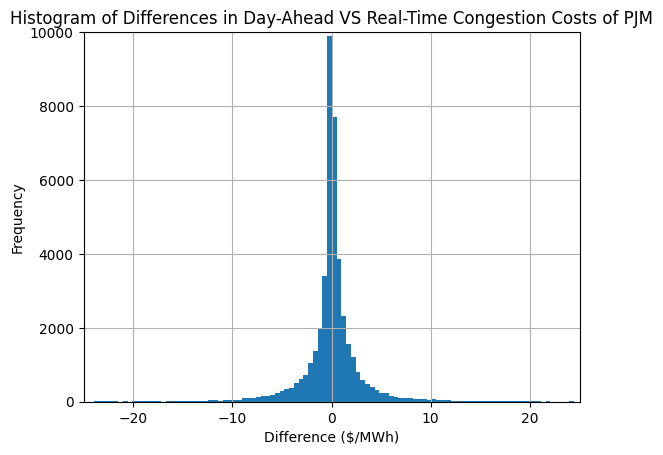

In [ ]:
#Histogram of Differences in Congestion Costs of Day-Ahead VS Real-Time for PJM

PJMcongdiff = dataset['PJM_CONG_DIFF']

PJMcongdiff_hist = PJMcongdiff.hist(bins = 800)

plt.xlim(-25,25)
plt.ylim(0,10005)
plt.title("Histogram of Differences in Day-Ahead VS Real-Time Congestion Costs of PJM")
plt.xlabel("Difference ($/MWh)")
plt.ylabel("Frequency")

Text(0, 0.5, 'Frequency')

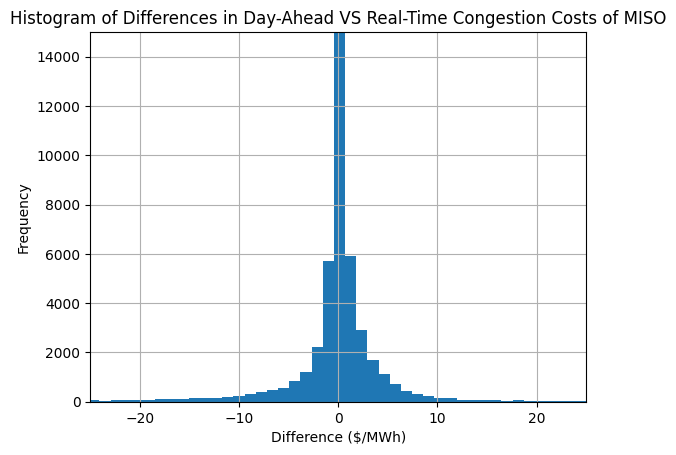

In [ ]:
#Histogram of Differences in Congestion Costs of Day-Ahead VS Real-Time for MISO

MISOcongdiff = dataset['MISO_CONG_DIFF']

MISOcongdiff_hist = MISOcongdiff.hist(bins = 800)

plt.xlim(-25,25)
plt.ylim(0,15000)
plt.title("Histogram of Differences in Day-Ahead VS Real-Time Congestion Costs of MISO")
plt.xlabel("Difference ($/MWh)")
plt.ylabel("Frequency")

Text(0, 0.5, 'Difference in Day-Ahead VS Real-Time Congestion Costs ($/MWh)')

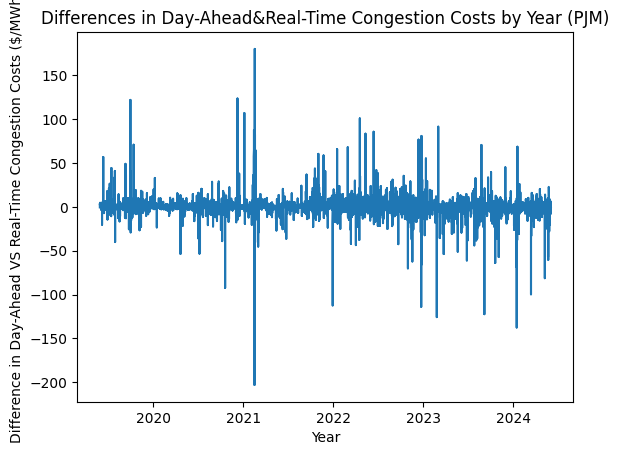

In [ ]:
#Line Graph of Differences in Congestion Costs of Day-Ahead VS Real-Time for PJM

PJMcongdiff_line = plt.plot(dataset['DATE'], PJMcongdiff)

plt.title("Differences in Day-Ahead&Real-Time Congestion Costs by Year (PJM)")
plt.xlabel("Year")
plt.ylabel("Difference in Day-Ahead VS Real-Time Congestion Costs ($/MWh)")

Text(0, 0.5, 'Difference in Day-Ahead VS Real-Time Congestion Costs ($/MWh)')

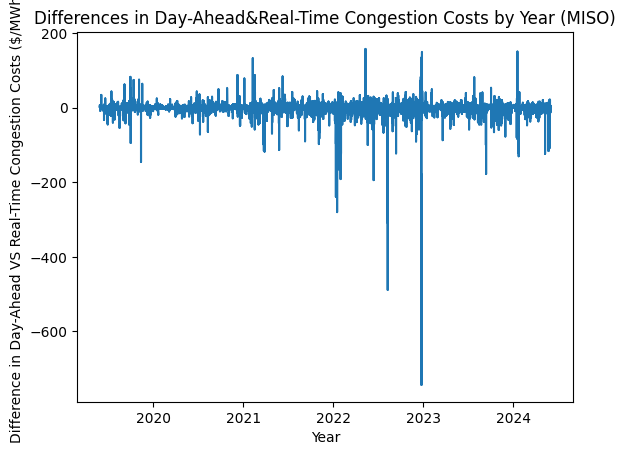

In [ ]:
#Line Graph of Differences in Congestion Costs of Day-Ahead VS Real-Time for MISO

MISOcongdiff_line = plt.plot(dataset['DATE'], MISOcongdiff)

plt.title("Differences in Day-Ahead&Real-Time Congestion Costs by Year (MISO)")
plt.xlabel("Year")
plt.ylabel("Difference in Day-Ahead VS Real-Time Congestion Costs ($/MWh)")

# Line graph to compare difference between real-time and forcast load in PJM and MISO market (Ellie)

In [ ]:
#creating a new colomn of difference between real-time and forcasted load in PJM market
dataset['Diff_FC_PJM_Load'] = dataset["PJM_RTLOAD"]-dataset['PJM_LOAD_FC']
dataset['Diff_FC_PJM_Load'].describe()

,Diff_FC_PJM_Load
count,43772.00
mean,-599.51
std,312.74
min,-4379.03
25%,-760.36
50%,-577.97
75%,-425.88
max,3510.67


In [ ]:
#creating a new colomn of difference between real-time and forcasted load in PJM market
dataset['Diff_FC_MISO_Load'] = dataset["MISO_RTLOAD"]-dataset['MISO_LOAD_FC']
dataset['Diff_FC_MISO_Load'].describe()

,Diff_FC_MISO_Load
count,43772.00
mean,-118.24
std,1476.21
min,-10929.73
25%,-973.94
50%,-82.43
75%,763.50
max,9550.14


Text(0, 0.5, 'Difference in real-time and forcasted load')

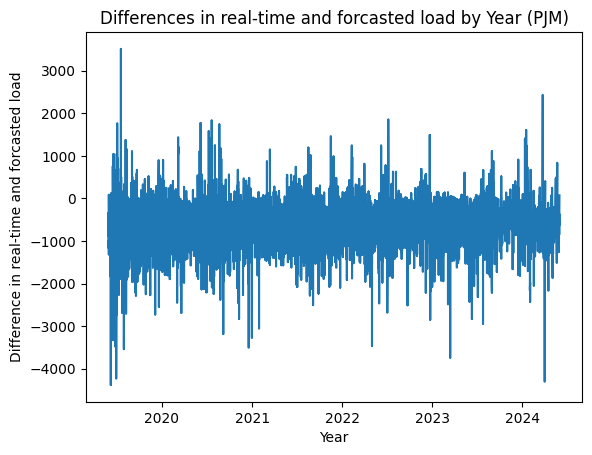

In [ ]:
#line graph of Differences in real-time and forcasted load by Year in PJM market
PJM_diff_FC = dataset['Diff_FC_PJM_Load']
PJM_diff_FC_line = plt.plot(dataset['DATE'], PJM_diff_FC)
plt.title("Differences in real-time and forcasted load by Year (PJM)")
plt.xlabel("Year")
plt.ylabel("Difference in real-time and forcasted load")

Text(0, 0.5, 'Difference in real-time and forcasted load')

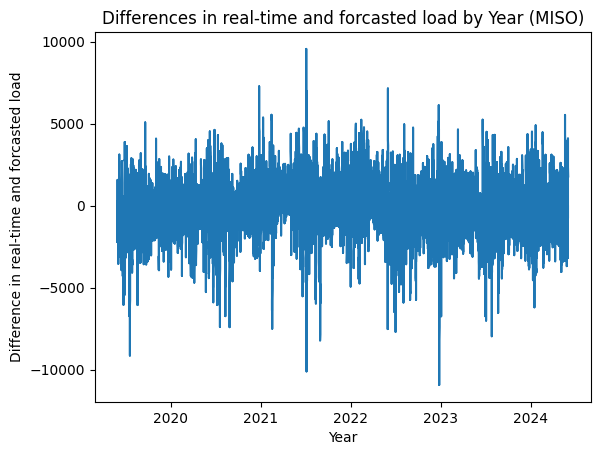

In [ ]:
#line graph of Differences in real-time and forcasted load by Year in PJM market
MISO_diff_FC = dataset['Diff_FC_MISO_Load']
MISO_diff_FC_line = plt.plot(dataset['DATE'], MISO_diff_FC)
plt.title("Differences in real-time and forcasted load by Year (MISO)")
plt.xlabel("Year")
plt.ylabel("Difference in real-time and forcasted load")

##**MISO plots from 2020 to 2021**


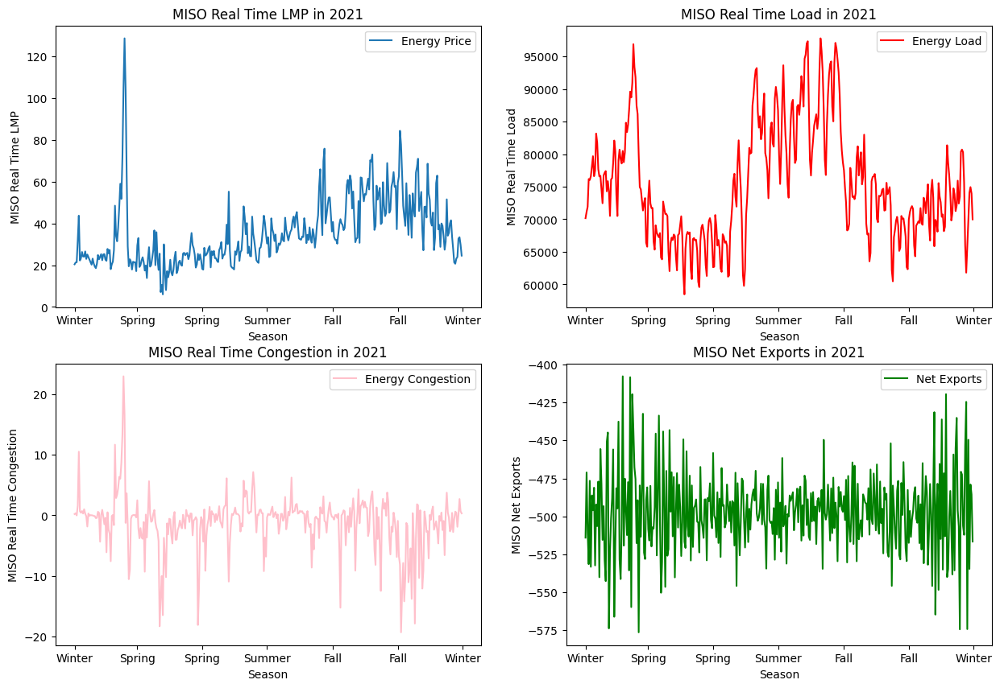

In [ ]:
#2021 MISO
data2021_smth = data2021[['DATE','MISO_RT_LMP','PJMC_RT_LMP','MISO_RT_CONG','PJMC_RT_CONG',
                          'MISO_RTLOAD','PJM_RTLOAD','MISO_Net_Exports','PJM_Net_Exports']]
daily_avg_2021 = data2021_smth.groupby(data2021_smth['DATE'].dt.date).mean()

# MISO plots for 2021

#Create a 2x2 grid of subplots for 2021
fig, axis = plt.subplots(2, 2, figsize=(15, 10))

#Plot 1: MISO Real Time LMP in 2021
axis[0, 0].plot(daily_avg_2021.index, daily_avg_2021['MISO_RT_LMP'],label = 'Energy Price')
axis[0, 0].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[0, 0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0, 0].set_xlabel('Season')
axis[0, 0].set_ylabel('MISO Real Time LMP')
axis[0, 0].legend(loc='best',fontsize='medium')
axis[0, 0].set_title('MISO Real Time LMP in 2021')

#Plot 2: MISO Real Time Load in 2021
axis[0, 1].plot(daily_avg_2021.index, daily_avg_2021['MISO_RTLOAD'],color ='red',label = 'Energy Load')
axis[0, 1].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[0, 1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0, 1].set_xlabel('Season')
axis[0, 1].set_ylabel('MISO Real Time Load')
axis[0,1].legend(loc='best',fontsize='medium')
axis[0, 1].set_title('MISO Real Time Load in 2021')

#Plot 3: MISO Real Time Congestion in 2021
axis[1, 0].plot(daily_avg_2021.index, daily_avg_2021['MISO_RT_CONG'],color ='pink',label = 'Energy Congestion')
axis[1, 0].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1, 0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1, 0].set_xlabel('Season')
axis[1, 0].set_ylabel('MISO Real Time Congestion')
axis[1, 0].legend(loc='best',fontsize='medium')
axis[1, 0].set_title('MISO Real Time Congestion in 2021')

#plot 4: MISO Net Exports in 2021
axis[1, 1].plot(daily_avg_2021.index, daily_avg_2021['MISO_Net_Exports'],color = 'green',label = 'Net Exports')
axis[1, 1].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1, 1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1, 1].set_xlabel('Season')
axis[1, 1].set_ylabel('MISO Net Exports')
axis[1, 1].legend(loc='best',fontsize='medium')
axis[1, 1].set_title('MISO Net Exports in 2021')

# Show the plots
plt.show()

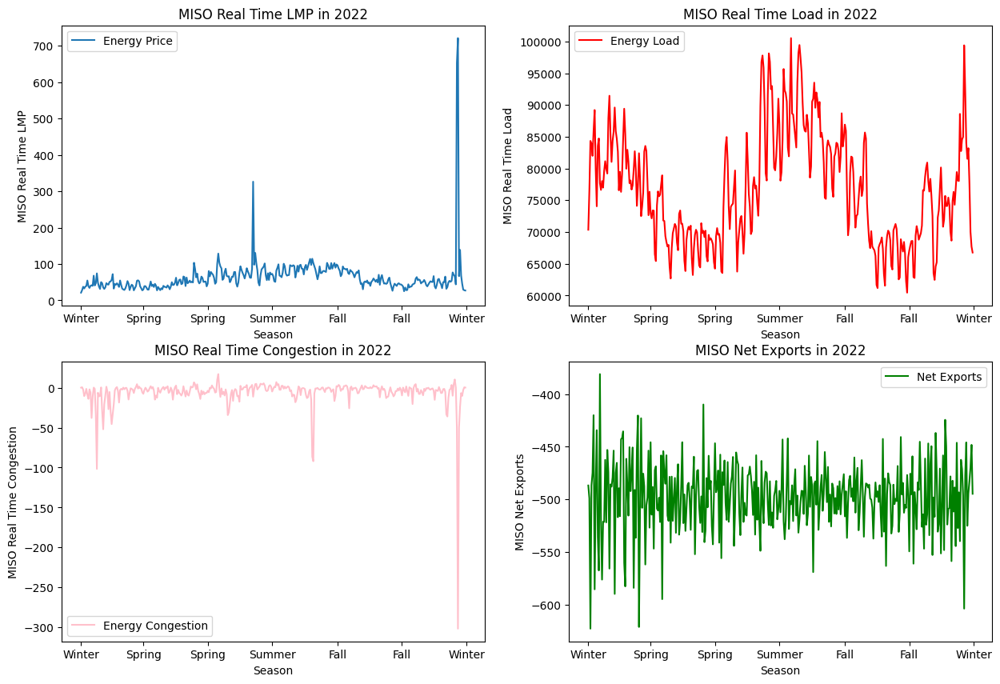

,DATE,MISO_RT_LMP,PJMC_RT_LMP,MISO_RT_CONG,PJMC_RT_CONG,MISO_RTLOAD,PJM_RTLOAD,MISO_Net_Exports,PJM_Net_Exports
DATE,,,,,,,,,
2022-12-24,2022-12-24,721.27,206.57,-301.73,-13.83,92266.4,123169.39,-477.38,-20.35


In [ ]:
#2022 MISO
data2022_smth = data2022[['DATE','MISO_RT_LMP','PJMC_RT_LMP','MISO_RT_CONG','PJMC_RT_CONG',
                          'MISO_RTLOAD','PJM_RTLOAD','MISO_Net_Exports','PJM_Net_Exports']]
daily_avg_2022 = data2022_smth.groupby(data2022_smth['DATE'].dt.date).mean()

# MISO plots for 2022

#Create a 2x2 grid of subplots for 2022
fig,axis = plt.subplots(2,2,figsize=(15,10))

#Plot 1: MISO Real Time LMP in 2022
axis[0,0].plot(daily_avg_2022.index, daily_avg_2022['MISO_RT_LMP'],label ='Energy Price')
axis[0,0].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_xlabel('Season')
axis[0,0].set_ylabel('MISO Real Time LMP')
axis[0,0].legend(loc ='best',fontsize='medium')
axis[0,0].set_title('MISO Real Time LMP in 2022')

#plot 2: MISO Real Time Load in 2022
axis[0,1].plot(daily_avg_2022.index, daily_avg_2022['MISO_RTLOAD'],color ='red',label ='Energy Load')
axis[0,1].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_xlabel('Season')
axis[0,1].set_ylabel('MISO Real Time Load')
axis[0,1].legend(loc ='best',fontsize='medium')
axis[0,1].set_title('MISO Real Time Load in 2022')

#plot 3: MISO Real Time Congestion in 2022
axis[1,0].plot(daily_avg_2022.index, daily_avg_2022['MISO_RT_CONG'],color ='pink',label ='Energy Congestion')
axis[1,0].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_xlabel('Season')
axis[1,0].set_ylabel('MISO Real Time Congestion')
axis[1,0].legend(loc ='best',fontsize='medium')
axis[1,0].set_title('MISO Real Time Congestion in 2022')

#Plot 4: MISO Net Exports in 2022
axis[1,1].plot(daily_avg_2022.index, daily_avg_2022['MISO_Net_Exports'],color ='green',label ='Net Exports')
axis[1,1].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_xlabel('Season')
axis[1,1].set_ylabel('MISO Net Exports')
axis[1,1].legend(loc ='best',fontsize='medium')
axis[1,1].set_title('MISO Net Exports in 2022')


# Show the plots
plt.show()

#Investigating the abonormal spike in winter 2022
max_price_date2022 = daily_avg_2022['MISO_RT_LMP'].idxmax()
data2022_max_price = daily_avg_2022[daily_avg_2022['DATE'].dt.date == max_price_date2022]
display(data2022_max_price)

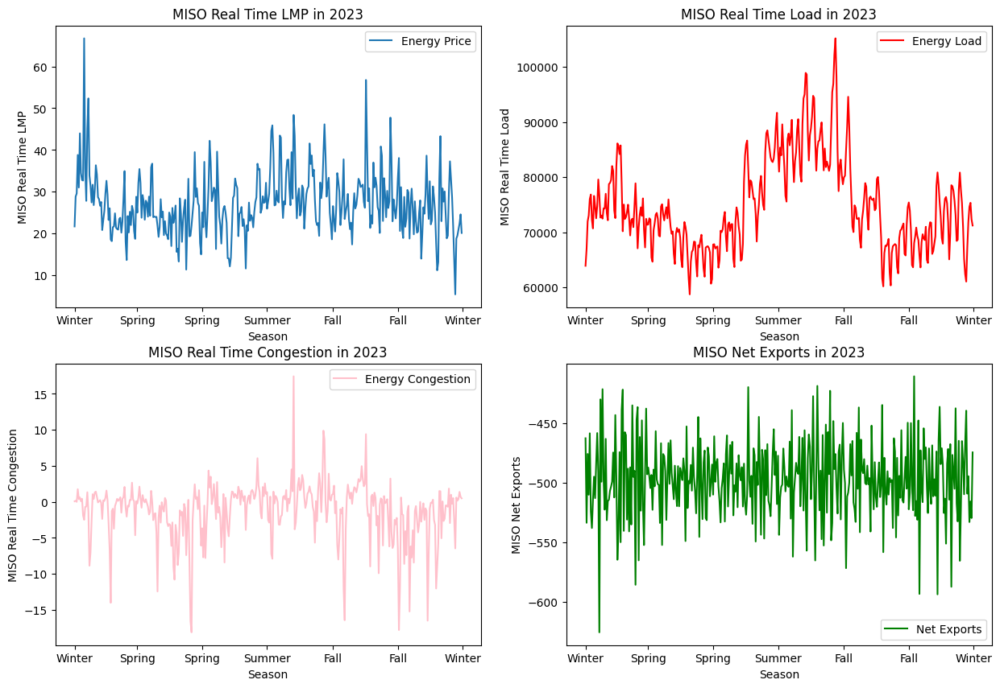

In [ ]:
#2023 MISO
data2023_smth = data2023[['DATE','MISO_RT_LMP','PJMC_RT_LMP','MISO_RT_CONG','PJMC_RT_CONG',
                            'MISO_RTLOAD','PJM_RTLOAD','MISO_Net_Exports','PJM_Net_Exports']]
daily_avg_2023 = data2023_smth.groupby(data2023_smth['DATE'].dt.date).mean()


# MISO plots for 2023

#Create a 2x2 grid of subplots for 2023
fig,axis = plt.subplots(2,2,figsize=(15,10))

#Plot 1: MISO Real Time LMP in 2023
axis[0,0].plot(daily_avg_2023.index, daily_avg_2023['MISO_RT_LMP'],label='Energy Price')
axis[0,0].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_xlabel('Season')
axis[0,0].set_ylabel('MISO Real Time LMP')
axis[0,0].legend(loc='best',fontsize='medium')
axis[0,0].set_title('MISO Real Time LMP in 2023')

#plot 2: MISO Real Time Load in 2023
axis[0,1].plot(daily_avg_2023.index, daily_avg_2023['MISO_RTLOAD'],color ='red',label='Energy Load')
axis[0,1].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_xlabel('Season')
axis[0,1].set_ylabel('MISO Real Time Load')
axis[0,1].legend(loc='best',fontsize='medium')
axis[0,1].set_title('MISO Real Time Load in 2023')

#plot 3: MISO Real Time Congestion in 2023
axis[1,0].plot(daily_avg_2023.index, daily_avg_2023['MISO_RT_CONG'],color='pink',label='Energy Congestion')
axis[1,0].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_xlabel('Season')
axis[1,0].set_ylabel('MISO Real Time Congestion')
axis[1,0].legend(loc='best',fontsize='medium')
axis[1,0].set_title('MISO Real Time Congestion in 2023')

#plot4: MISO Net Exports in 2023
axis[1,1].plot(daily_avg_2023.index, daily_avg_2023['MISO_Net_Exports'],color='green',label='Net Exports')
axis[1,1].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_xlabel('Season')
axis[1,1].set_ylabel('MISO Net Exports')
axis[1,1].legend(loc='best',fontsize='medium')
axis[1,1].set_title('MISO Net Exports in 2023')

# Show the plots
plt.show()



##PJM plots from 2020 to 2022

<ipython-input-93-12a7065beaf8>:42: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axis[1,1].legend(loc ='best',fontsize = 'medium')


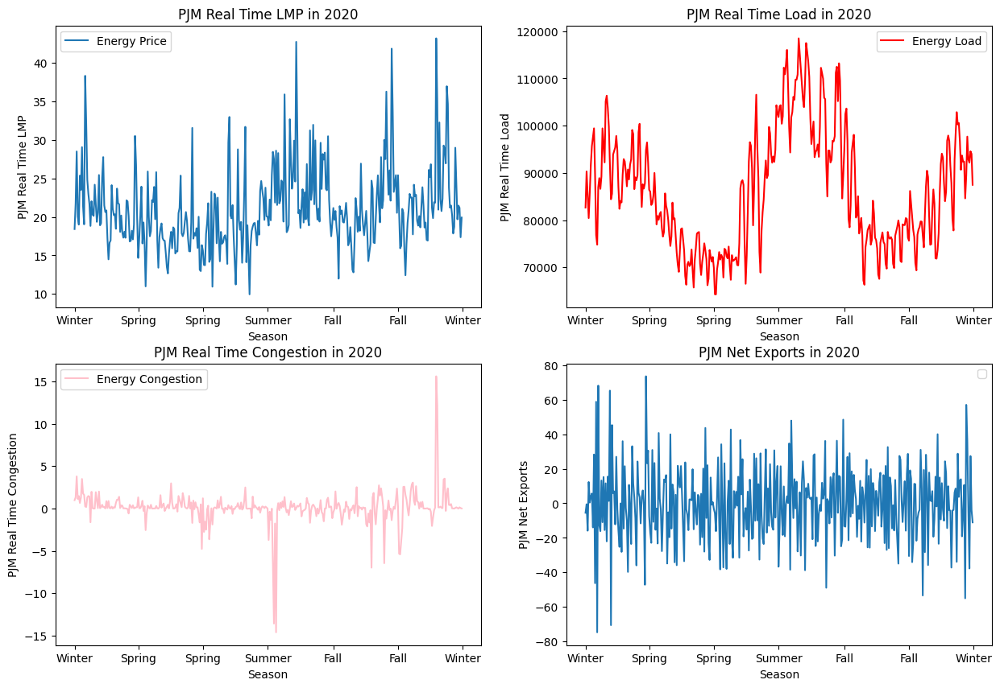

In [ ]:
#2020 PJM
data2020_smth = data2020[['DATE','MISO_RT_LMP','PJMC_RT_LMP','MISO_RT_CONG','PJMC_RT_CONG',
                            'MISO_RTLOAD','PJM_RTLOAD','MISO_Net_Exports','PJM_Net_Exports']]
daily_avg_2020 = data2020_smth.groupby(data2020_smth['DATE'].dt.date).mean()

# Create a 2x2 grid of subplots for 2020
fig,axis = plt.subplots(2,2, figsize = (15,10))

#plot 1: PJM Real Time LMP in 2020
axis[0,0].plot(daily_avg_2020.index, daily_avg_2020['PJMC_RT_LMP'],label = 'Energy Price')
axis[0,0].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_xlabel('Season')
axis[0,0].set_ylabel('PJM Real Time LMP')
axis[0,0].legend(loc ='best',fontsize = 'medium')
axis[0,0].set_title('PJM Real Time LMP in 2020')

#plot 2: PJM Real Time Load in 2020
axis[0,1].plot(daily_avg_2020.index, daily_avg_2020['PJM_RTLOAD'],color = 'red',label = 'Energy Load')
axis[0,1].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_xlabel('Season')
axis[0,1].set_ylabel('PJM Real Time Load')
axis[0,1].legend(loc ='best',fontsize = 'medium')
axis[0,1].set_title('PJM Real Time Load in 2020')

#plot 3: PJM Real Time Congestion in 2020
axis[1,0].plot(daily_avg_2020.index, daily_avg_2020['PJMC_RT_CONG'],color ='pink',label = 'Energy Congestion')
axis[1,0].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_xlabel('Season')
axis[1,0].set_ylabel('PJM Real Time Congestion')
axis[1,0].legend(loc ='best',fontsize = 'medium')
axis[1,0].set_title('PJM Real Time Congestion in 2020')

#plot 4: PJM Net Exports in 2020
axis[1,1].plot(daily_avg_2020.index, daily_avg_2020['PJM_Net_Exports'])
axis[1,1].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_xlabel('Season')
axis[1,1].set_ylabel('PJM Net Exports')
axis[1,1].legend(loc ='best',fontsize = 'medium')
axis[1,1].set_title('PJM Net Exports in 2020')

# Show the plots
plt.show()

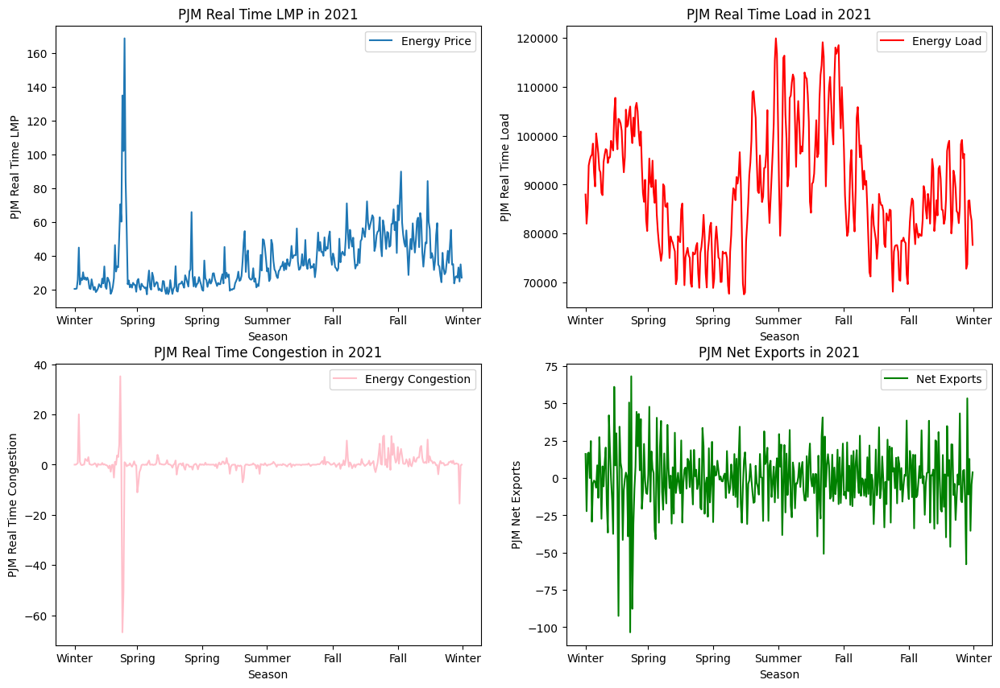

In [ ]:
#2021 PJM

# Create a 2x2 grid of subplots for 2021
fig,axis = plt.subplots(2,2, figsize = (15,10))

#plot 1: PJM Real Time LMP in 2021
axis[0,0].plot(daily_avg_2021.index, daily_avg_2021['PJMC_RT_LMP'],label ='Energy Price')
axis[0,0].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_xlabel('Season')
axis[0,0].set_ylabel('PJM Real Time LMP')
axis[0,0].legend(loc ='best',fontsize = 'medium')
axis[0,0].set_title('PJM Real Time LMP in 2021')

#plot 2: PJM Real Time Load in 2021
axis[0,1].plot(daily_avg_2021.index, daily_avg_2021['PJM_RTLOAD'],color ='red',label ='Energy Load')
axis[0,1].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_xlabel('Season')
axis[0,1].set_ylabel('PJM Real Time Load')
axis[0,1].legend(loc ='best',fontsize = 'medium')
axis[0,1].set_title('PJM Real Time Load in 2021')

#plot 3: PJM Real Time Congestion in 2021
axis[1,0].plot(daily_avg_2021.index, daily_avg_2021['PJMC_RT_CONG'],color ='pink',label ='Energy Congestion')
axis[1,0].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_xlabel('Season')
axis[1,0].set_ylabel('PJM Real Time Congestion')
axis[1,0].legend(loc ='best',fontsize = 'medium')
axis[1,0].set_title('PJM Real Time Congestion in 2021')

#plot 4: PJM Net Exports in 2021
axis[1,1].plot(daily_avg_2021.index, daily_avg_2021['PJM_Net_Exports'],color ='green',label ='Net Exports')
axis[1,1].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_xlabel('Season')
axis[1,1].set_ylabel('PJM Net Exports')
axis[1,1].legend(loc ='best',fontsize = 'medium')
axis[1,1].set_title('PJM Net Exports in 2021')

#Show the plots
plt.show()



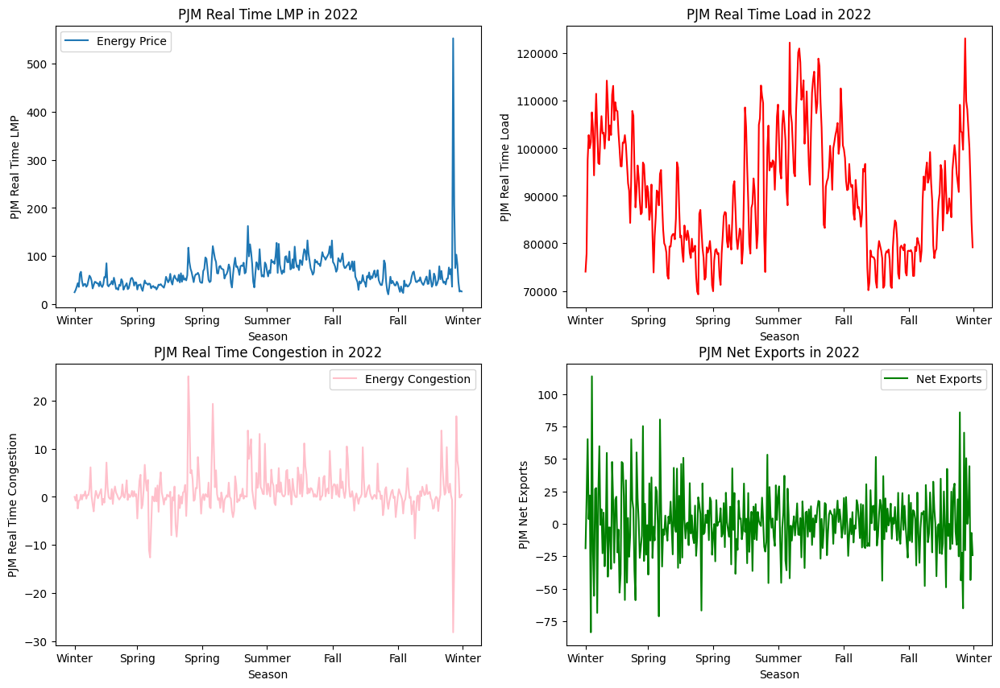

,DATE,MISO_RT_LMP,PJMC_RT_LMP,MISO_RT_CONG,PJMC_RT_CONG,MISO_RTLOAD,PJM_RTLOAD,MISO_Net_Exports,PJM_Net_Exports
DATE,,,,,,,,,
2022-12-23,2022-12-23,653.19,552.2,-50.5,-28.16,99390.95,110627.02,-603.62,70.35


In [ ]:
#2022 PJM

# Create a 2x2 grid of subplots for 2022
fig,axis = plt.subplots(2,2, figsize = (15,10))

#plot 1: PJM Real Time LMP in 2022
axis[0,0].plot(daily_avg_2022.index, daily_avg_2022['PJMC_RT_LMP'],label = 'Energy Price')
axis[0,0].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_xlabel('Season')
axis[0,0].set_ylabel('PJM Real Time LMP')
axis[0,0].legend(loc = 'best', fontsize = 'medium')
axis[0,0].set_title('PJM Real Time LMP in 2022')

#plot 2: PJM Real Time Load in 2022
axis[0,1].plot(daily_avg_2022.index, daily_avg_2022['PJM_RTLOAD'],color = 'red',label = 'Energy Load')
axis[0,1].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_xlabel('Season')
axis[0,1].set_ylabel('PJM Real Time Load')
axis[0,0].legend(loc = 'best', fontsize = 'medium')
axis[0,1].set_title('PJM Real Time Load in 2022')

#plot 3: PJM Real Time Congestion in 2022
axis[1,0].plot(daily_avg_2022.index, daily_avg_2022['PJMC_RT_CONG'], color = 'pink',label = 'Energy Congestion')
axis[1,0].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_xlabel('Season')
axis[1,0].set_ylabel('PJM Real Time Congestion')
axis[1,0].legend(loc = 'best', fontsize = 'medium')
axis[1,0].set_title('PJM Real Time Congestion in 2022')

#plot 4: PJM Net Exports in 2022
axis[1,1].plot(daily_avg_2022.index, daily_avg_2022['PJM_Net_Exports'],color ='green',label = 'Net Exports')
axis[1,1].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_xlabel('Season')
axis[1,1].set_ylabel('PJM Net Exports')
axis[1,1].legend(loc = 'best', fontsize = 'medium')
axis[1,1].set_title('PJM Net Exports in 2022')

# Show the plots
plt.show()

# Find the date with the highest MISO Real Time Locational Marginal Price (LMP)
max_price_date2 = daily_avg_2022['PJMC_RT_LMP'].idxmax()

# Filter the data2019 dataframe to get all data for the date with the highest price
data_max_price2 = daily_avg_2022[daily_avg_2022['DATE'].dt.date == max_price_date2]

display(data_max_price2)

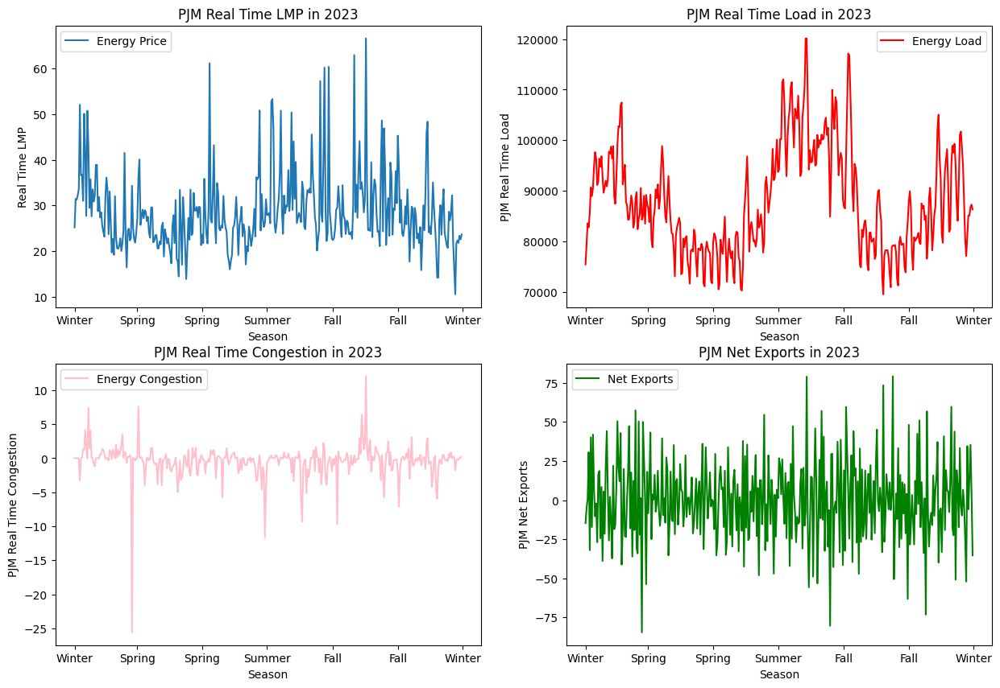

In [ ]:
#2023 PJM

# Create a 2x2 grid of subplots for 2023
fig,axis = plt.subplots(2,2, figsize = (15,10))

#plot 1: PJM Real Time LMP in 2023
axis[0,0].plot(daily_avg_2023.index, daily_avg_2023['PJMC_RT_LMP'],label = 'Energy Price')
axis[0,0].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_xlabel('Season')
axis[0,0].set_ylabel('Real Time LMP')
axis[0,0].legend(loc = 'best',fontsize='medium')
axis[0,0].set_title('PJM Real Time LMP in 2023')

#plot 2: PJM Real Time Load in 2023
axis[0,1].plot(daily_avg_2023.index, daily_avg_2023['PJM_RTLOAD'],color='red',label = 'Energy Load')
axis[0,1].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_xlabel('Season')
axis[0,1].set_ylabel('PJM Real Time Load')
axis[0,1].legend(loc = 'best',fontsize='medium')
axis[0,1].set_title('PJM Real Time Load in 2023')

#Plot 3: PJM Real Time Congestion in 2023
axis[1,0].plot(daily_avg_2023.index, daily_avg_2023['PJMC_RT_CONG'],color = 'pink',label = 'Energy Congestion')
axis[1,0].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_xlabel('Season')
axis[1,0].set_ylabel('PJM Real Time Congestion')
axis[1,0].legend(loc = 'best',fontsize='medium')
axis[1,0].set_title('PJM Real Time Congestion in 2023')

#plot 4: PJM Net Exports in 2023
axis[1,1].plot(daily_avg_2023.index, daily_avg_2023['PJM_Net_Exports'],color = 'green', label = 'Net Exports')
axis[1,1].set_xticks(['2023-01','2023-03','2023-05','2023-07','2023-09','2023-11','2024-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_xlabel('Season')
axis[1,1].set_ylabel('PJM Net Exports')
axis[1,1].legend(loc = 'best',fontsize='medium')
axis[1,1].set_title('PJM Net Exports in 2023')

plt.tight_layout
plt.show()





##** PJM vs MISO from 2020 to 2022**

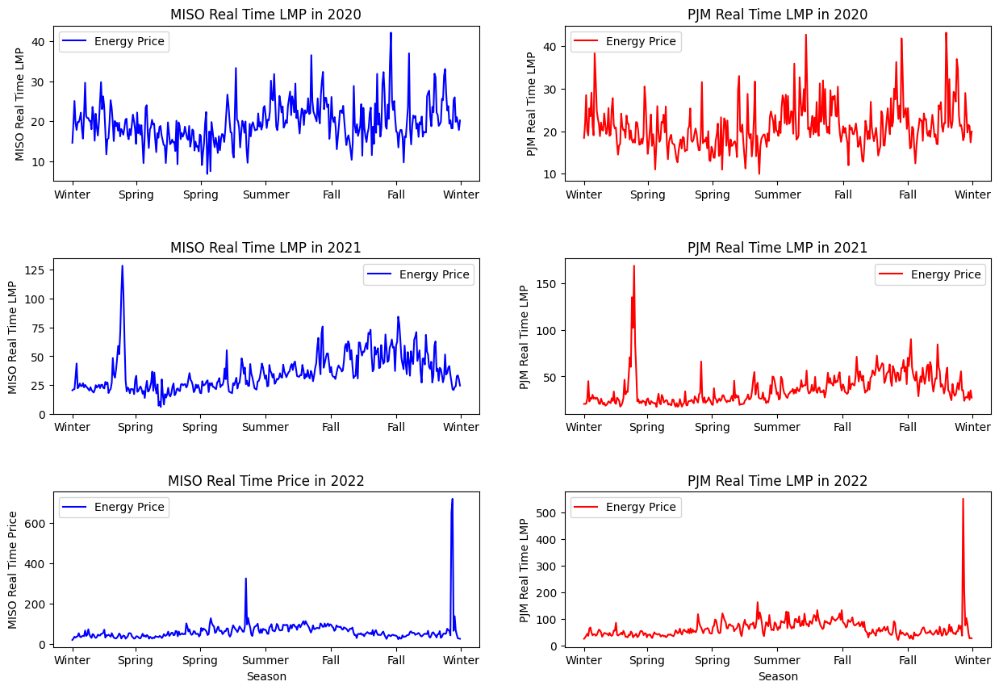

In [ ]:
#3x2 grid of subplots for 2020 to 2022
fig,axis = plt.subplots(3,2, figsize = (15,10))

#plot1: MISO Real Time LMP in 2020
axis[0,0].plot(daily_avg_2020.index, daily_avg_2020['MISO_RT_LMP'],color ='blue',label = 'Energy Price')
axis[0,0].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_ylabel('MISO Real Time LMP')
axis[0,0].legend(loc ='best',fontsize = 'medium')
axis[0,0].set_title('MISO Real Time LMP in 2020')

#plot 2: PJM Real Time LMP in 2020
axis[0,1].plot(daily_avg_2020.index, daily_avg_2020['PJMC_RT_LMP'],color = 'red',label = 'Energy Price')
axis[0,1].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_ylabel('PJM Real Time LMP')
axis[0,1].legend(loc ='best',fontsize = 'medium')
axis[0,1].set_title('PJM Real Time LMP in 2020')

#MISO Real Time LMP in 2021
axis[1,0].plot(daily_avg_2021.index, daily_avg_2021['MISO_RT_LMP'],color = 'blue',label = 'Energy Price')
axis[1,0].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_ylabel('MISO Real Time LMP')
axis[1,0].legend(loc ='best',fontsize = 'medium')
axis[1,0].set_title('MISO Real Time LMP in 2021')

#plot 4: PJM Real Time LMP in 2021
axis[1,1].plot(daily_avg_2021.index, daily_avg_2021['PJMC_RT_LMP'],color = 'red',label = 'Energy Price')
axis[1,1].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_ylabel('PJM Real Time LMP')
axis[1,1].legend(loc ='best',fontsize = 'medium')
axis[1,1].set_title('PJM Real Time LMP in 2021')

#plot 5: MISO Real Time Congestion in 2022
axis[2,0].plot(daily_avg_2022.index, daily_avg_2022['MISO_RT_LMP'],color = 'blue',label = 'Energy Price')
axis[2,0].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[2,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[2,0].set_xlabel('Season')
axis[2,0].set_ylabel('MISO Real Time Price')
axis[2,0].legend(loc ='best',fontsize = 'medium')
axis[2,0].set_title('MISO Real Time Price in 2022')

#plot 6: PJM Real Time Congestion in 2022
axis[2,1].plot(daily_avg_2022.index, daily_avg_2022['PJMC_RT_LMP'],color = 'red',label = 'Energy Price')
axis[2,1].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[2,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[2,1].set_xlabel('Season')
axis[2,1].set_ylabel('PJM Real Time LMP')
axis[2,1].legend(loc ='best',fontsize = 'medium')
axis[2,1].set_title('PJM Real Time LMP in 2022')

fig.subplots_adjust(hspace=0.5)
plt.tight_layout
plt.show()

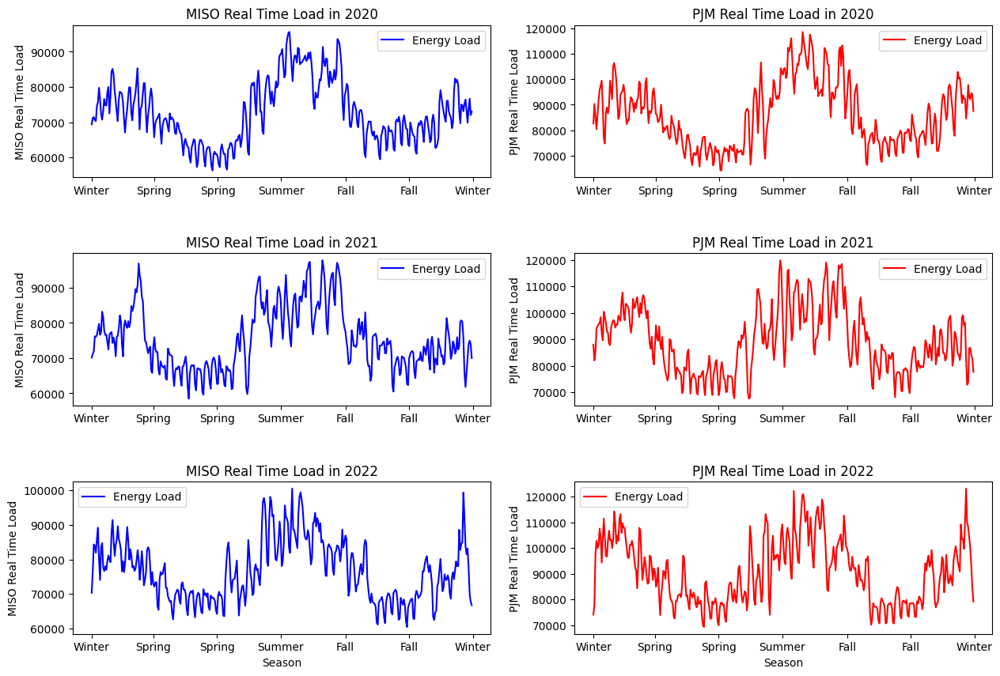

In [ ]:
#3x2 grid of subplots for 2020 to 2022
fig,axis = plt.subplots(3,2, figsize = (15,10))

#plot1: MISO Real Time Load in 2020
axis[0,0].plot(daily_avg_2020.index, daily_avg_2020['MISO_RTLOAD'],color ='blue',label = 'Energy Load')
axis[0,0].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[0,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,0].set_ylabel('MISO Real Time Load')
axis[0,0].legend(loc ='best',fontsize = 'medium')
axis[0,0].set_title('MISO Real Time Load in 2020')

#plot 2: PJM Real Time Load in 2020
axis[0,1].plot(daily_avg_2020.index, daily_avg_2020['PJM_RTLOAD'],color = 'red',label = 'Energy Load')
axis[0,1].set_xticks(['2020-01','2020-03','2020-05','2020-07','2020-09','2020-11','2021-01'])
axis[0,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[0,1].set_ylabel('PJM Real Time Load')
axis[0,1].legend(loc ='best',fontsize = 'medium')
axis[0,1].set_title('PJM Real Time Load in 2020')

#plot 3: MISO Real Time Load in 2021
axis[1,0].plot(daily_avg_2021.index, daily_avg_2021['MISO_RTLOAD'],color = 'blue',label = 'Energy Load')
axis[1,0].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,0].set_ylabel('MISO Real Time Load')
axis[1,0].legend(loc ='best',fontsize = 'medium')
axis[1,0].set_title('MISO Real Time Load in 2021')

#plot4: PJM Real Time Load in 2021
axis[1,1].plot(daily_avg_2021.index, daily_avg_2021['PJM_RTLOAD'],color = 'red',label = 'Energy Load')
axis[1,1].set_xticks(['2021-01','2021-03','2021-05','2021-07','2021-09','2021-11','2022-01'])
axis[1,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[1,1].set_ylabel('PJM Real Time Load')
axis[1,1].legend(loc ='best',fontsize = 'medium')
axis[1,1].set_title('PJM Real Time Load in 2021')

#plot 5: MISO Real Time Load in 2022
axis[2,0].plot(daily_avg_2022.index, daily_avg_2022['MISO_RTLOAD'],color = 'blue',label = 'Energy Load')
axis[2,0].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[2,0].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[2,0].set_xlabel('Season')
axis[2,0].set_ylabel('MISO Real Time Load')
axis[2,0].legend(loc ='best',fontsize = 'medium')
axis[2,0].set_title('MISO Real Time Load in 2022')

#plot 6: PJM Real Time Load in 2022
axis[2,1].plot(daily_avg_2022.index, daily_avg_2022['PJM_RTLOAD'],color = 'red',label = 'Energy Load')
axis[2,1].set_xticks(['2022-01','2022-03','2022-05','2022-07','2022-09','2022-11','2023-01'])
axis[2,1].set_xticklabels(['Winter','Spring','Spring','Summer','Fall','Fall','Winter'])
axis[2,1].set_xlabel('Season')
axis[2,1].set_ylabel('PJM Real Time Load')
axis[2,1].legend(loc ='best',fontsize = 'medium')
axis[2,1].set_title('PJM Real Time Load in 2022')

plt.subplots_adjust(hspace=0.5)
plt.tight_layout
plt.show()



##**Correlation Heat Matrix**

Text(0.5, 1.0, 'Correlation Matrix')

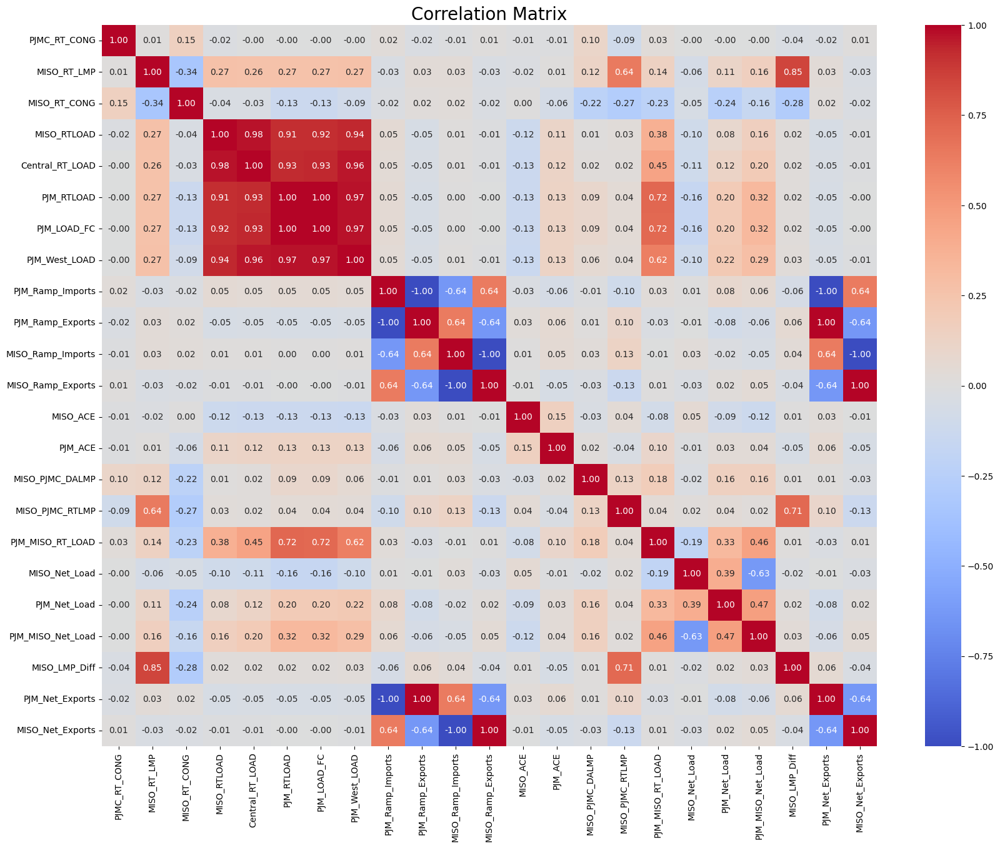

In [ ]:
corr = dataset[['PJMC_RT_CONG', 'MISO_RT_LMP','MISO_RT_CONG', 'MISO_RTLOAD',
                'Central_RT_LOAD', 'PJM_RTLOAD','PJM_LOAD_FC', 'PJM_West_LOAD',
                'PJM_Ramp_Imports','PJM_Ramp_Exports', 'MISO_Ramp_Imports', 'MISO_Ramp_Exports',
                'MISO_ACE', 'PJM_ACE', 'MISO_PJMC_DALMP', 'MISO_PJMC_RTLMP','PJM_MISO_RT_LOAD',
                'MISO_Net_Load', 'PJM_Net_Load', 'PJM_MISO_Net_Load','MISO_LMP_Diff', 'PJM_Net_Exports',
                'MISO_Net_Exports',]].corr()
plt.figure(figsize=(20,15))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix', fontsize=20)

##**Stacked Bar Chart for different type of Electricity Sources

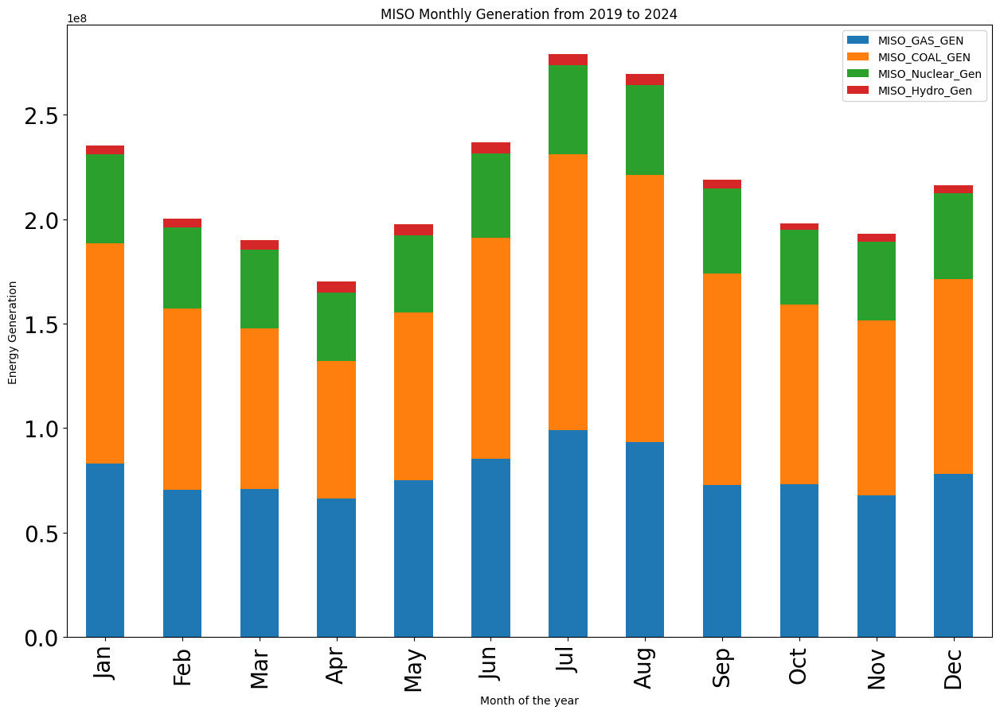

In [ ]:
energydata = dataset[['DATE','MISO_RTLOAD','PJM_RTLOAD','MISO_GAS_GEN','MISO_COAL_GEN',
                           'MISO_Nuclear_Gen','MISO_Hydro_Gen','PJM_GAS_Gen','PJM_Coal_Gen','PJM_Nuclear_Gen','PJM_Hydro_Gen']]

monthly_energydata = energydata.groupby(energydata['DATE'].dt.month).sum(numeric_only=True)

#MISO monthly generation from 2019 to 2024
monthly_energydata[['MISO_GAS_GEN','MISO_COAL_GEN',
                           'MISO_Nuclear_Gen','MISO_Hydro_Gen']].plot(kind='bar',stacked = True, figsize=(15,10),fontsize=20)

plt.xlabel('Month of the year')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],
           ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.ylabel('Energy Generation')
plt.title('MISO Monthly Generation from 2019 to 2024')

plt.show()




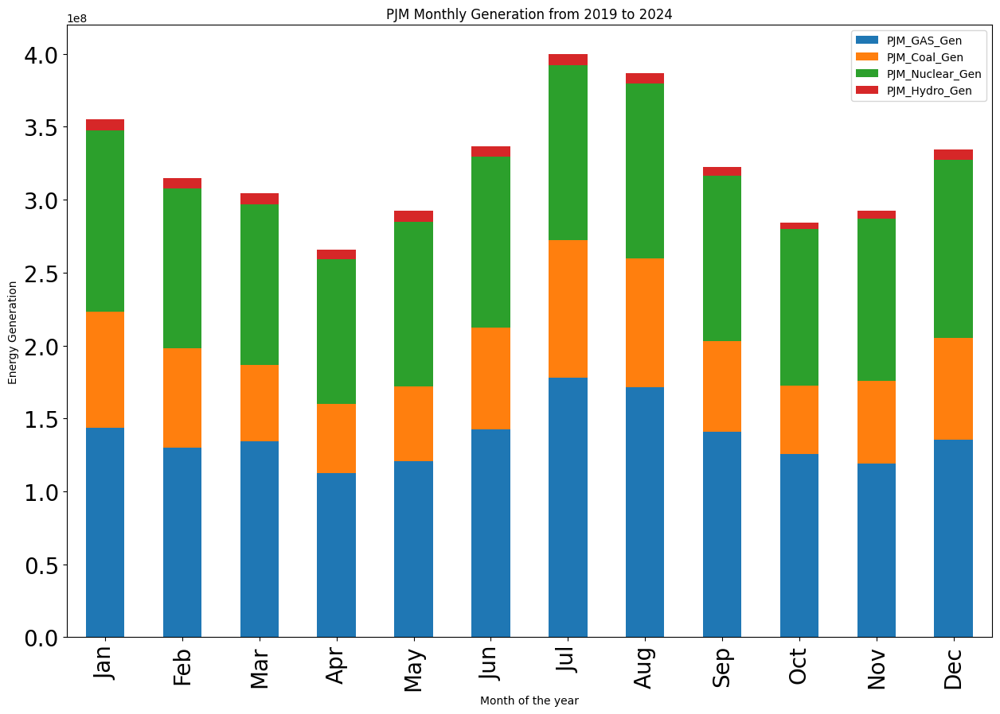

In [ ]:
#PJM monthly generation from 2019 to 2024
monthly_energydata[['PJM_GAS_Gen','PJM_Coal_Gen',
                    'PJM_Nuclear_Gen','PJM_Hydro_Gen']].plot(kind='bar',stacked = True, figsize=(15,10),fontsize=20)
plt.xlabel('Month of the year')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11],
           ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
plt.ylabel('Energy Generation')
plt.title('PJM Monthly Generation from 2019 to 2024')

plt.show()

## Line chart for LMP price differences over time in PJM and MISO market

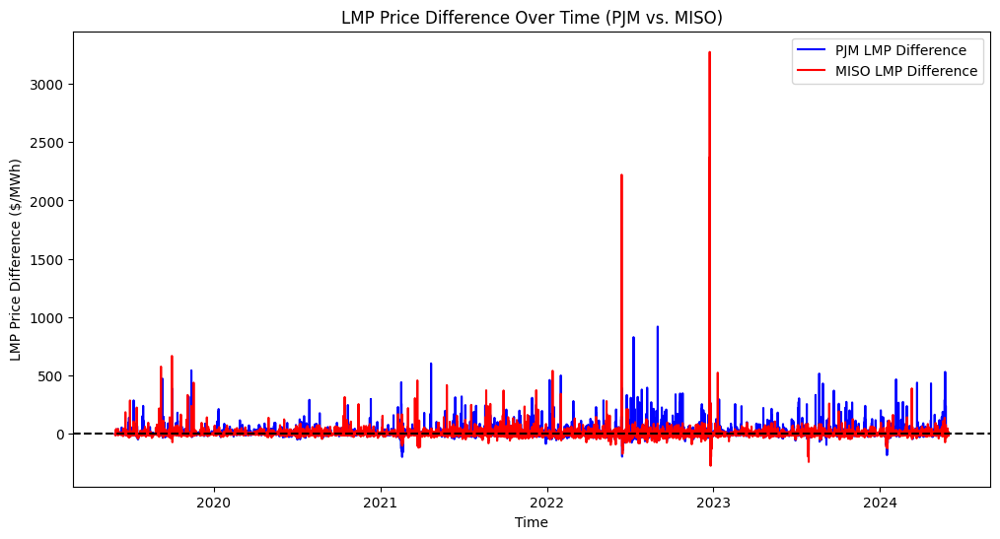

In [ ]:
plt.figure(figsize=(12, 6))

# Plot PJM and MISO LMP Differences
plt.plot(dataset['Date_Time'], dataset['PJM_LMP_Diff'], label='PJM LMP Difference', color='blue')
plt.plot(dataset['Date_Time'], dataset['MISO_LMP_Diff'], label='MISO LMP Difference', color='red')

# Add a horizontal reference line at zero to indicate no price difference
plt.axhline(0, color='black', linestyle='dashed')

# Label the axes
plt.xlabel("Time")
plt.ylabel("LMP Price Difference ($/MWh)")

# Set title
plt.title("LMP Price Difference Over Time (PJM vs. MISO)")

# Show legend to differentiate between PJM and MISO
plt.legend()

# Display
plt.show()

## Histogram of Net Exports in PJM and MISO

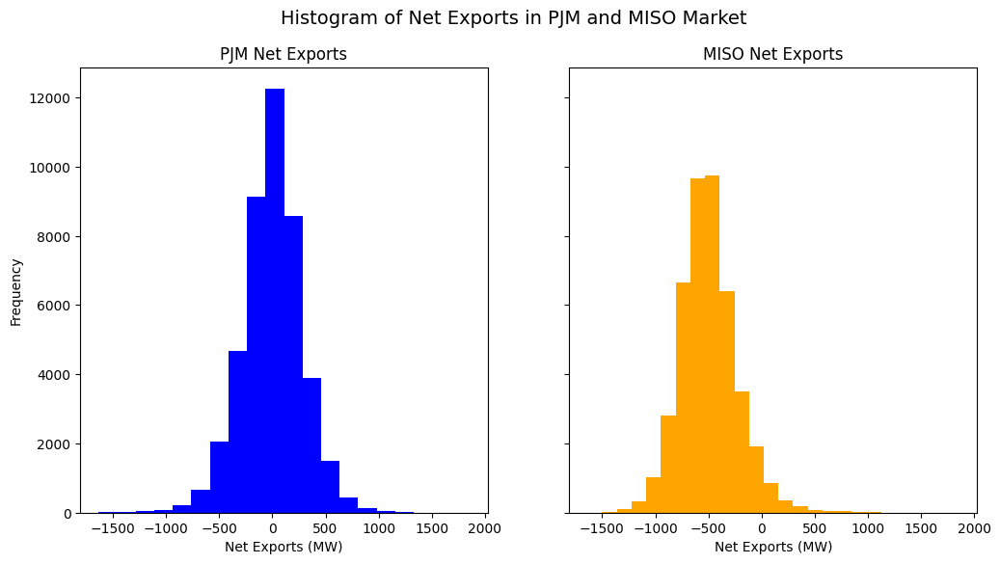

In [ ]:
# Create figure and axes for two subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharex=True, sharey=True)

# Plot histograms separately for PJM and MISO Net Exports
dataset['PJM_Net_Exports'].plot(kind='hist', bins=20, ax=axes[0], color='blue')
dataset['MISO_Net_Exports'].plot(kind='hist', bins=20, ax=axes[1], color='orange')

# Set titles for each subplot
axes[0].set_title("PJM Net Exports")
axes[1].set_title("MISO Net Exports")

# Set x-axis label and y-axis label for PJM market
axes[0].set_xlabel("Net Exports (MW)")
axes[0].set_ylabel("Frequency")

# Set x-axis label and y-axis label for MISO market
axes[1].set_xlabel("Net Exports (MW)")
axes[1].set_ylabel("Frequency")

# Set a main title for the entire figure
plt.suptitle("Histogram of Net Exports in PJM and MISO Market", fontsize=14)

# Show the plot
plt.show()

## Scatter Plot: Net Exports vs. Real-Time LMP Price

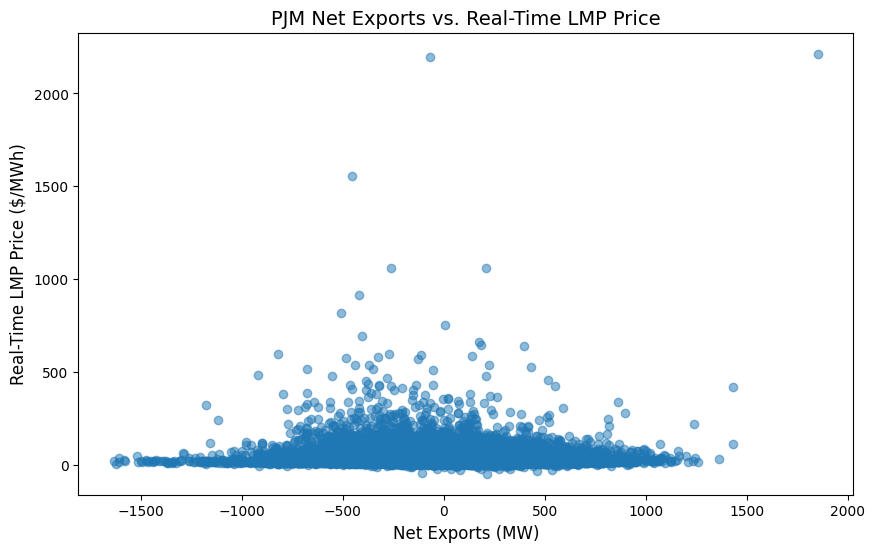

In [ ]:
# Scatter plot to examine relationships between Net Exports and LMP in PJM
plt.figure(figsize=(10,6))
plt.scatter(x=dataset['PJM_Net_Exports'], y=dataset['PJMC_RT_LMP'], alpha=0.5)
plt.title("PJM Net Exports vs. Real-Time LMP Price", fontsize=14)
plt.xlabel("Net Exports (MW)", fontsize=12)
plt.ylabel("Real-Time LMP Price ($/MWh)", fontsize=12)
plt.show()

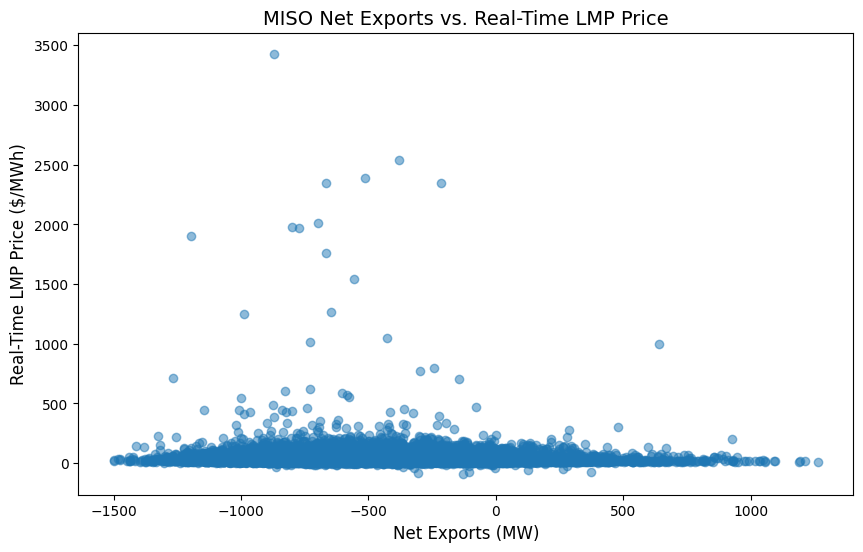

In [ ]:
# Scatter plot to examine correlation between Net Exports and LMP in MISO
plt.figure(figsize=(10,6))
plt.scatter(x=dataset['MISO_Net_Exports'], y=dataset['MISO_RT_LMP'], alpha=0.5)
plt.title("MISO Net Exports vs. Real-Time LMP Price", fontsize=14)
plt.xlabel("Net Exports (MW)", fontsize=12)
plt.ylabel("Real-Time LMP Price ($/MWh)", fontsize=12)
plt.show()

## Scatter matrix and Heatmap to show correlations between net exports and LMP

In [ ]:
# select columns that want to check correlations
correlations = dataset[['PJM_Net_Exports', 'MISO_Net_Exports', 'PJMC_RT_LMP', 'MISO_RT_LMP', 'PJM_RTLOAD', 'MISO_RTLOAD']].corr()

[Text(0, 0, 'PJM_Net_Exports'),
 Text(0, 1, 'MISO_Net_Exports'),
 Text(0, 2, 'PJMC_RT_LMP'),
 Text(0, 3, 'MISO_RT_LMP'),
 Text(0, 4, 'PJM_RTLOAD'),
 Text(0, 5, 'MISO_RTLOAD')]

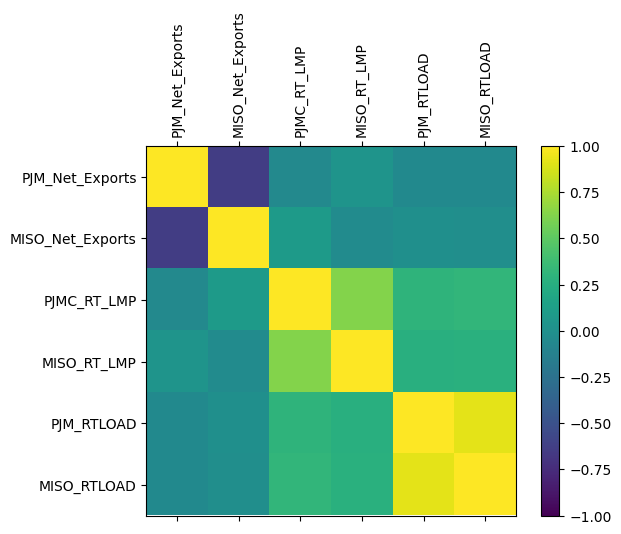

In [ ]:
# plot heatmap
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)

# change the tick labels
ticks = range(0,6,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
numeric_columns = correlations.select_dtypes(include='number')
ax.set_xticklabels(numeric_columns, rotation=90)
ax.set_yticklabels(numeric_columns)



<Figure size 2000x1500 with 0 Axes>

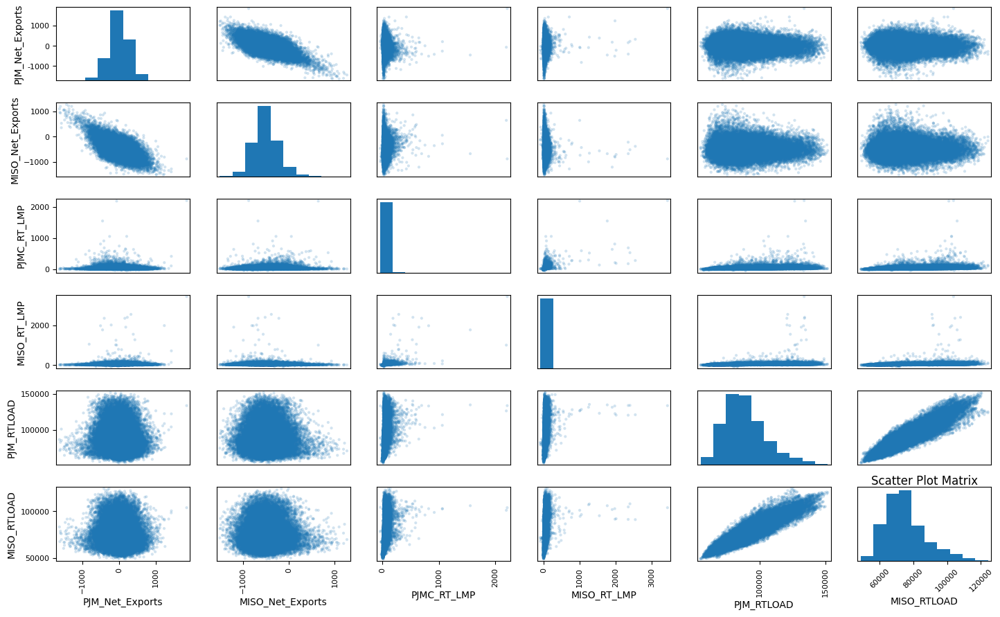

In [ ]:
#Scatter Plot matrix
plt.figure(figsize=(20,15))
scatter_matrix(dataset[['PJM_Net_Exports', 'MISO_Net_Exports', 'PJMC_RT_LMP', 'MISO_RT_LMP', 'PJM_RTLOAD', 'MISO_RTLOAD']], alpha=0.2,figsize=(15,10),diagonal='hist')
plt.xticks(rotation=45)  # Rotate x-axis labels to prevent overlap
plt.yticks(rotation=45)  # Rotate y-axis labels to prevent overlap
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.1, top=0.9, wspace=0.2, hspace=0.3)  # Adjust the spacing
plt.title('Scatter Plot Matrix',y=0.95)
plt.show()

## Correlation Analysis between net exports and LMP with grouping by season, weekday/weekend and hour

In [ ]:
# Define the variables to analyze
variables = ['PJM_Net_Exports', 'PJMC_RT_LMP', 'MISO_Net_Exports', 'MISO_RT_LMP', 'PJM_RTLOAD', 'MISO_RTLOAD']

In [ ]:
# Compute correlation for each season
seasonal_correlations = dataset.groupby('ON_OFF')[variables].corr()
print(seasonal_correlations)

# Compute correlation for weekend / weekday
day_correlations = dataset.groupby('Day_Type')[variables].corr()
print(day_correlations)

# Compute correlation for each hour category
hour_correlations = dataset.groupby('Hour_Category')[variables].corr()
print(hour_correlations)

                         PJM_Net_Exports  PJMC_RT_LMP  MISO_Net_Exports  \
ON_OFF                                                                    
OFF    PJM_Net_Exports          1.00e+00        -0.01         -7.39e-01   
       PJMC_RT_LMP             -1.30e-02         1.00          5.01e-02   
       MISO_Net_Exports        -7.39e-01         0.05          1.00e+00   
       MISO_RT_LMP              3.57e-02         0.47         -7.34e-03   
       PJM_RTLOAD               1.04e-02         0.28         -6.28e-02   
       MISO_RTLOAD             -6.31e-03         0.29         -5.47e-02   
ON     PJM_Net_Exports          1.00e+00        -0.06         -5.66e-01   
       PJMC_RT_LMP             -5.85e-02         1.00          1.07e-01   
       MISO_Net_Exports        -5.66e-01         0.11          1.00e+00   
       MISO_RT_LMP              5.21e-02         0.68         -4.84e-02   
       PJM_RTLOAD              -1.70e-02         0.26          1.50e-02   
       MISO_RTLOAD       

<ipython-input-110-5fe4ba099241>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  seasonal_correlations = dataset.groupby('ON_OFF')[variables].corr()


##Subplots: Histogram

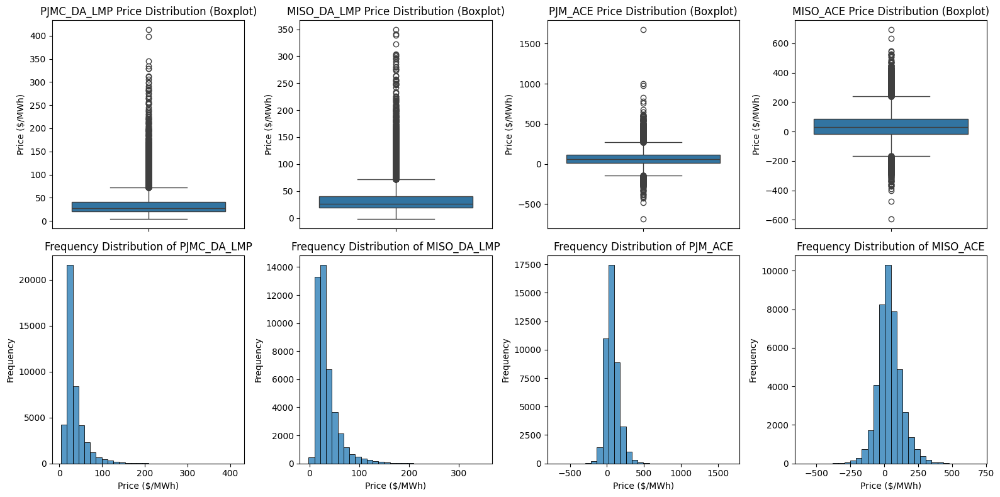

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

variables = ["PJMC_DA_LMP", "MISO_DA_LMP", "PJM_ACE", "MISO_ACE"]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 8))

axes = axes.flatten()

for i, var in enumerate(variables):
    sns.boxplot(y=dataset[var], ax=axes[i])
    axes[i].set_title(f"{var} Price Distribution (Boxplot)")
    axes[i].set_ylabel("Price ($/MWh)")
    axes[i].set_xlabel("")

    sns.histplot(dataset[var], bins=30, kde=False, ax=axes[i + len(variables)])
    axes[i + len(variables)].set_title(f"Frequency Distribution of {var}")
    axes[i + len(variables)].set_xlabel("Price ($/MWh)")
    axes[i + len(variables)].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


##Line Chart - Changes in Congestion Cost Trends by Month for PJM and MISO**

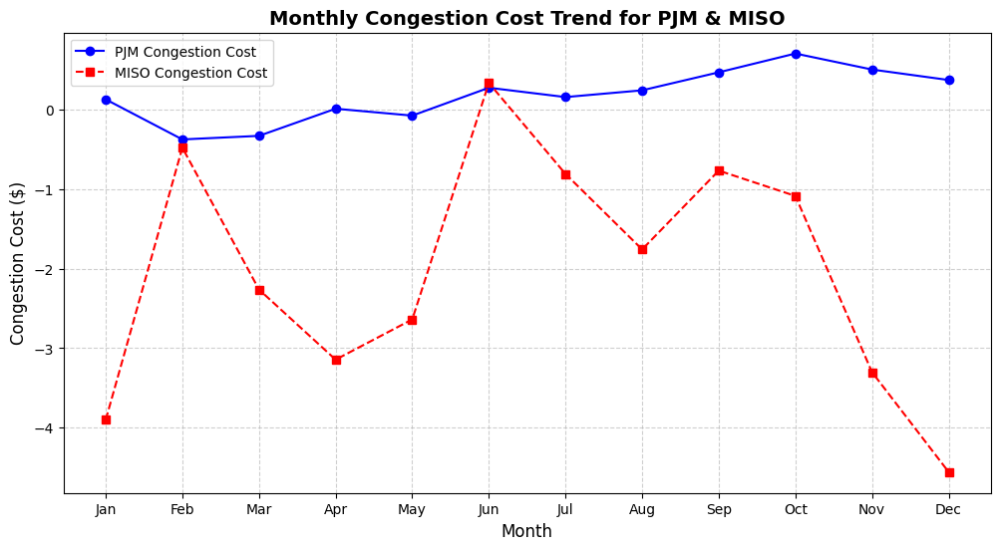

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Reload the dataset with the correct timestamp column
file_path = "raw_data.csv"
df = pd.read_csv(file_path, parse_dates=['Date/Time'])

# Rename the timestamp column for consistency
df.rename(columns={'Date/Time': 'Timestamp'}, inplace=True)

# Extract month and season information
df['Month'] = df['Timestamp'].dt.month
df['Season'] = df['Timestamp'].dt.month % 12 // 3 + 1  # 1=Winter, 2=Spring, 3=Summer, 4=Fall

# Compute monthly congestion cost averages
monthly_congestion = df.groupby('Month')[['PJMC RT CONG', 'MISO RT CONG']].mean()

# Plot congestion cost trends
plt.figure(figsize=(12,6))
plt.plot(monthly_congestion.index, monthly_congestion['PJMC RT CONG'], label='PJM Congestion Cost', color='blue', marker='o')
plt.plot(monthly_congestion.index, monthly_congestion['MISO RT CONG'], label='MISO Congestion Cost', color='red', linestyle="--", marker='s')
plt.xlabel("Month", fontsize=12)
plt.ylabel("Congestion Cost ($)", fontsize=12)
plt.title("Monthly Congestion Cost Trend for PJM & MISO", fontsize=14, fontweight='bold')
plt.legend()
plt.xticks(range(1,13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Text(0.5, 1.0, 'Correlation Matrix')

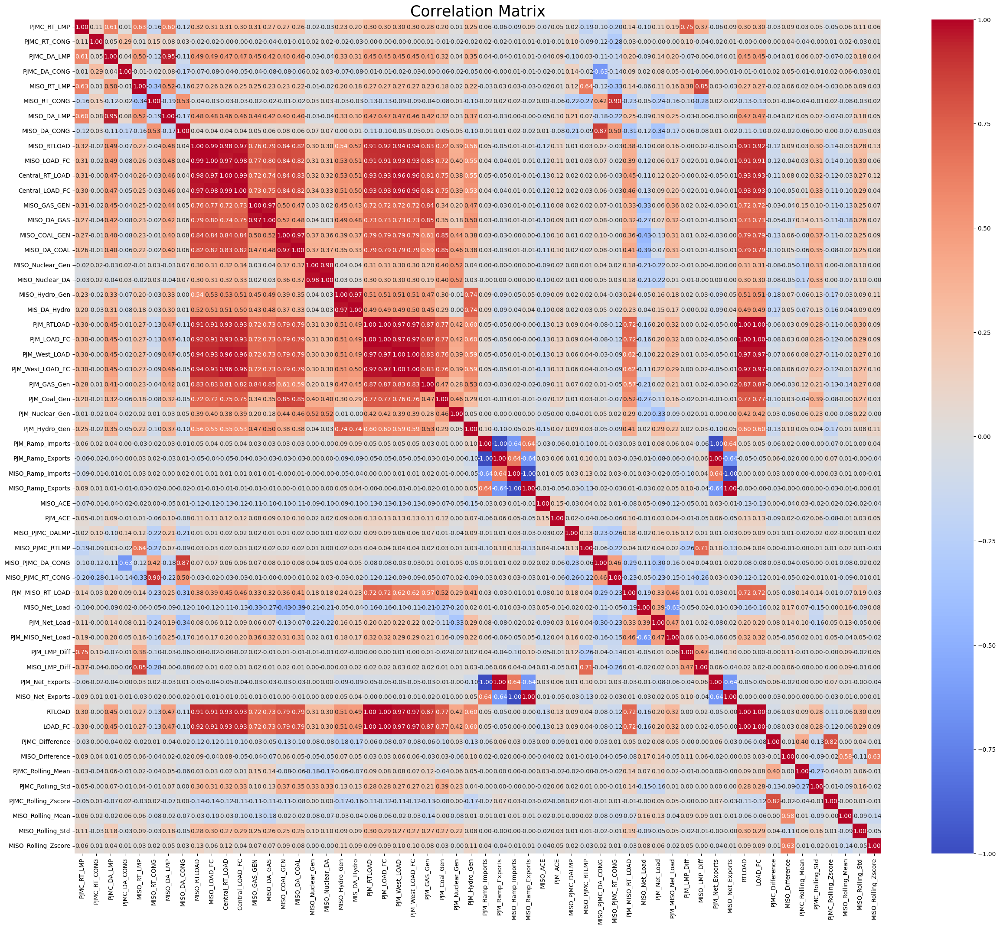

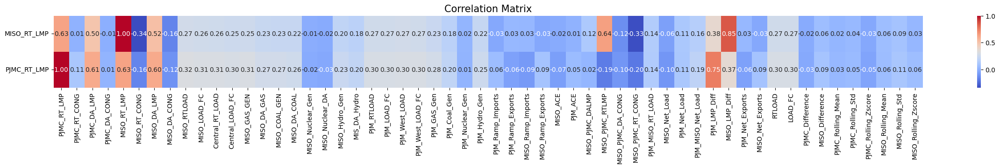

In [ ]:
corr = dataset[['PJMC_RT_LMP',
       'PJMC_RT_CONG', 'PJMC_DA_LMP', 'PJMC_DA_CONG', 'MISO_RT_LMP',
       'MISO_RT_CONG', 'MISO_DA_LMP', 'MISO_DA_CONG', 'MISO_RTLOAD',
       'MISO_LOAD_FC', 'Central_RT_LOAD', 'Central_LOAD_FC', 'MISO_GAS_GEN',
       'MISO_DA_GAS', 'MISO_COAL_GEN', 'MISO_DA_COAL', 'MISO_Nuclear_Gen',
       'MISO_Nuclear_DA', 'MISO_Hydro_Gen', 'MIS_DA_Hydro', 'PJM_RTLOAD',
       'PJM_LOAD_FC', 'PJM_West_LOAD', 'PJM_West_LOAD_FC', 'PJM_GAS_Gen',
       'PJM_Coal_Gen', 'PJM_Nuclear_Gen', 'PJM_Hydro_Gen', 'PJM_Ramp_Imports',
       'PJM_Ramp_Exports', 'MISO_Ramp_Imports', 'MISO_Ramp_Exports',
       'MISO_ACE', 'PJM_ACE', 'MISO_PJMC_DALMP', 'MISO_PJMC_RTLMP',
       'MISO_PJMC_DA_CONG', 'MISO_PJMC_RT_CONG', 'PJM_MISO_RT_LOAD',
       'MISO_Net_Load', 'PJM_Net_Load', 'PJM_MISO_Net_Load',
       'PJM_LMP_Diff','MISO_LMP_Diff', 'PJM_Net_Exports', 'MISO_Net_Exports',
       'RTLOAD', 'LOAD_FC',
       'PJMC_Difference', 'MISO_Difference', 'PJMC_Rolling_Mean',
       'PJMC_Rolling_Std', 'PJMC_Rolling_Zscore',
       'MISO_Rolling_Mean', 'MISO_Rolling_Std', 'MISO_Rolling_Zscore']].corr()
plt.figure(figsize=(30,25))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix', fontsize=25)

filtered_corr_matrix = corr.loc[['MISO_RT_LMP','PJMC_RT_LMP'],:]
plt.figure(figsize=(30,2))
sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix', fontsize=15)

## Classification Modeling

##Real Time Load Boxplots and Histograms

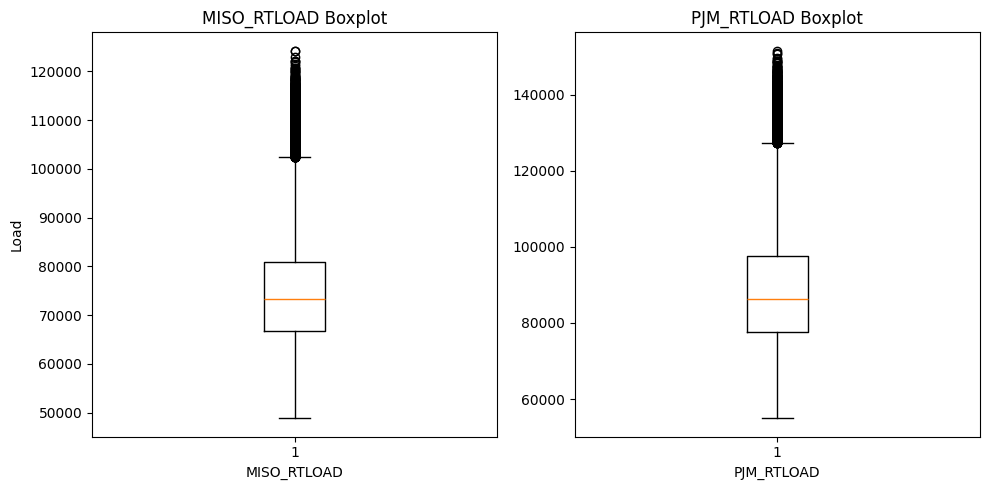

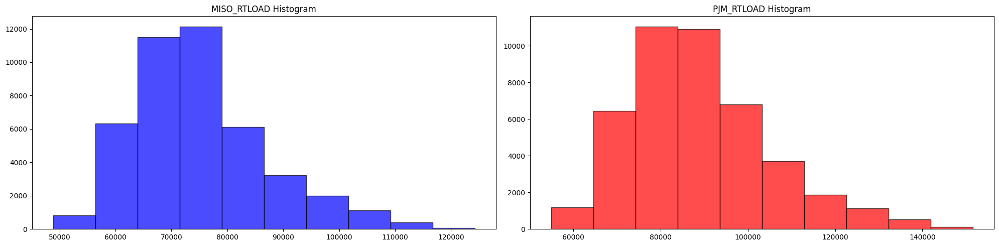

In [ ]:
# Create a figure and axes for the boxplots
plt.figure(figsize=(10, 5))

# Boxplot for MISO_RTLOAD
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.boxplot(dataset['MISO_RTLOAD'])
plt.title('MISO_RTLOAD Boxplot')
plt.ylabel('Load')
plt.xlabel('MISO_RTLOAD')

# Boxplot for PJM_RTLOAD
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.boxplot(dataset['PJM_RTLOAD'])
plt.title('PJM_RTLOAD Boxplot')
plt.xlabel('PJM_RTLOAD')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

# Create a figure and axes for the histograms
plt.figure(figsize=(20, 5))

# Histogram for MISO_RTLOAD
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.hist(dataset['MISO_RTLOAD'], bins=10, color='blue', alpha=0.7,edgecolor='black')
plt.title('MISO_RTLOAD Histogram')

# Histogram for PJM_RTLOAD
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.hist(dataset['PJM_RTLOAD'], bins=10, color='red', alpha=0.7,edgecolor='black')
plt.title('PJM_RTLOAD Histogram')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


##Feature Engineering for Categorical features consideration


In [ ]:
#Encoding ON_OFF

# Define a function to convert ON/OFF to 1/0
def convert_on_off(column):
    return column.replace({'ON': 1, 'OFF': 0})

# Apply the function to the ON_OFF column
dataset['Peak_status'] = convert_on_off(dataset['ON_OFF'])

display(dataset[['ON_OFF', 'Peak_status', 'MISO_RTLOAD']])

#Getting Months and Day of Weeks
dataset['month'] = dataset['Date_Time'].dt.month
dataset['day_of_week'] = dataset['Date_Time'].dt.dayofweek


#Transform and Group data by hours of the day
dataset['Date_Time'] = pd.to_datetime(dataset['Date_Time']) #convert the Date_Time column to datetime
dataset['Hour'] = dataset['Date_Time'].dt.hour #extract the hour from the Date_Time column
dataset['Hour'] = dataset['Hour'].astype('int32') #convert the hour to integer

#define funct to categorize the hours of the day
def hour_category(hour):
    if hour >= 6 and hour <= 12:
        return 'Morning'
    elif hour >= 13 and hour <= 18:
        return 'Afternoon'
    elif hour >= 19 and hour <= 23 or hour == 0:
        return 'Evening'
    else:
        return 'Overnight'

dataset['Hour_Category'] = dataset['Hour'].apply(hour_category) #apply the function to the Hour column



<ipython-input-31-583235a3bcfa>:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  return column.replace({'ON': 1, 'OFF': 0})
<ipython-input-31-583235a3bcfa>:5: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  return column.replace({'ON': 1, 'OFF': 0})


,ON_OFF,Peak_status,MISO_RTLOAD
0,OFF,0,69151.88
1,OFF,0,65624.75
2,OFF,0,63339.86
3,OFF,0,61863.34
4,OFF,0,61501.48
...,...,...,...
43767,ON,1,83118.39
43768,ON,1,81181.54
43769,ON,1,79458.48
43770,OFF,0,76422.58


##Binning Real Time Load into different demands level for both markets

PJM_Load_Category,Low Demand,Medium Demand,High Demand
Season,,,
Fall,4920,4108,1880
Spring,6160,3918,970
Summer,2237,2502,6274
Winter,1274,4062,5467


MISO_Load_Category,Low Demand,Medium Demand,High Demand
Hour_Category,,,
Afternoon,1587,4096,5266
Evening,1839,3828,5268
Morning,4676,4638,3462
Overnight,6489,2028,595


MISO_Load_Category,Low Demand,Medium Demand,High Demand
ON_OFF,,,
OFF,9394,3681,1506
ON,5197,10909,13085


MISO_Load_Category,Low Demand,Medium Demand,High Demand
Month,,,
1,487,1354,1875
2,652,1411,1343
3,1716,1778,216
4,2395,1194,7
5,1931,1102,709
6,857,718,2022
7,433,736,2538
8,554,744,2411
9,1232,931,1436


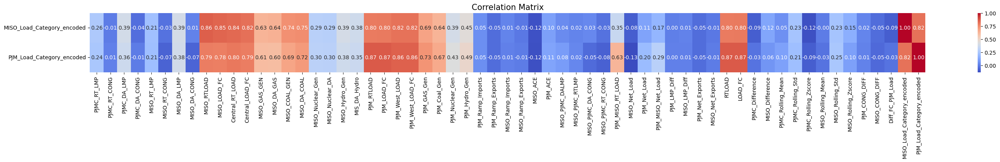

In [ ]:
#Categorized Electricity Load for each market into Low, Medium, and High Demand
#splitting by 3 quartiles - 33% each
dataset['MISO_Load_Category'] = pd.qcut(dataset['MISO_RTLOAD'], q=3, labels=['Low Demand', 'Medium Demand', 'High Demand'])
dataset['PJM_Load_Category'] = pd.qcut(dataset['PJM_RTLOAD'], q=3, labels=['Low Demand', 'Medium Demand', 'High Demand'])

#ordinal-econding the Load Category
load_category_mapping = {'Low Demand': 1, 'Medium Demand': 2, 'High Demand': 3}
dataset['MISO_Load_Category_encoded'] = dataset['MISO_Load_Category'].map(load_category_mapping).astype('float64')
dataset['PJM_Load_Category_encoded'] = dataset['PJM_Load_Category'].map(load_category_mapping).astype('float64')

#hot-encoded the categorical features
categorical_features = ['Season', 'ON_OFF']  # Example categorical features
dataset_encoded = pd.get_dummies(dataset, columns=categorical_features)


#filter only float columns - Explore Continuous features
float_columns = dataset.select_dtypes(include=['float64'])
correlation_matrix = float_columns.corr()

filtered_corr_matrix = correlation_matrix.loc[['MISO_Load_Category_encoded','PJM_Load_Category_encoded'],:]
plt.figure(figsize=(35,2))
sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix', fontsize=15)

#Explore Categorical features
display(pd.crosstab(dataset['Season'], dataset['PJM_Load_Category']))
display(pd.crosstab(dataset['Hour_Category'], dataset['MISO_Load_Category']))
display(pd.crosstab(dataset['ON_OFF'], dataset['MISO_Load_Category']))
display(pd.crosstab(dataset['Month'], dataset['MISO_Load_Category']))

## Data Splitting and Train Decision Tree Model - MISO

Model Accuracy: 0.9231296402055968
Central_RT_LOAD: 0.7353
PJM_MISO_RT_LOAD: 0.0560
MISO_DA_GAS: 0.0207
RTLOAD: 0.0200
MISO_COAL_GEN: 0.0166
PJM_RTLOAD: 0.0148
PJM_LOAD_FC: 0.0123
MISO_Net_Load: 0.0115
MISO_GAS_GEN: 0.0107
LOAD_FC: 0.0069
PJM_MISO_Net_Load: 0.0066
MISO_DA_COAL: 0.0056
PJMC_Rolling_Mean: 0.0041
MISO_Nuclear_DA: 0.0039
PJM_Nuclear_Gen: 0.0034
MIS_DA_Hydro: 0.0034
MISO_Rolling_Std: 0.0033
PJM_GAS_Gen: 0.0032
MISO_Difference: 0.0030
PJMC_Rolling_Std: 0.0030
MISO_Nuclear_Gen: 0.0028
PJMC_DA_LMP: 0.0028
MISO_Rolling_Mean: 0.0027
MISO_PJMC_DALMP: 0.0023
PJMC_Rolling_Zscore: 0.0022
PJMC_RT_LMP: 0.0022
PJM_Hydro_Gen: 0.0022
Central_LOAD_FC: 0.0021
MISO_Hydro_Gen: 0.0019
PJM_Coal_Gen: 0.0019
MISO_PJMC_RTLMP: 0.0018
MISO_ACE: 0.0018
PJMC_DA_CONG: 0.0016
MISO_PJMC_DA_CONG: 0.0016
PJMC_RT_CONG: 0.0016
MISO_DA_CONG: 0.0016
PJM_ACE: 0.0015
MISO_LMP_Diff: 0.0015
PJM_Net_Exports: 0.0015
MISO_PJMC_RT_CONG: 0.0014
MISO_Rolling_Zscore: 0.0014
MISO_CONG_DIFF: 0.0013
MISO_DA_LMP: 0.0012
MIS

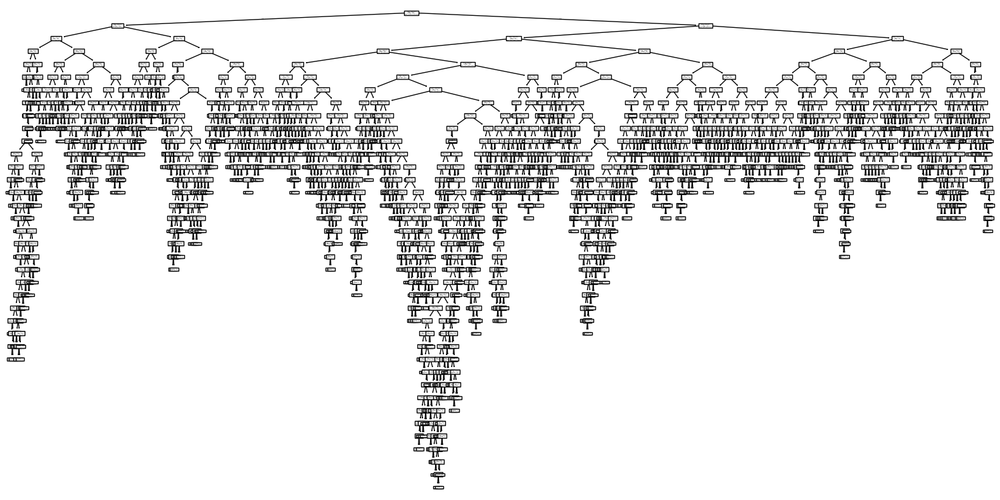

In [ ]:
#ensure no missing values in target variable
dataset = dataset.dropna(subset=['MISO_Load_Category_encoded'])

#Filter on the float columns
float_columns = dataset.select_dtypes(include=['float64'])

#Train / Test set Splitting with commonly use 80/20 split
X = float_columns.drop(['MISO_Load_Category_encoded','MISO_RTLOAD','MISO_LOAD_FC'], axis=1)
y = dataset['MISO_Load_Category_encoded']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

#Model accuracy / Score -> looks nice but prob is overfitted
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Model Accuracy: {accuracy}')

#Evaluating Feature Importance
importance = model.feature_importances_
features_name = X.columns
feature_importance_dict = dict(zip(features_name, importance))
sorted_features = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")

# Plot the decision tree to vizualize the model complexity -> Too complex
plt.figure(figsize=(20, 10))
plot_tree(model)
plt.show()

## Improving Model and Performance and improve overfitting

In [ ]:
#Tuning the model - 2 steps

#step 1 - Find the optimal decision tree dimension
#Grid search for optimal hyperparameters / Finding optimal tree depth
parameters = {
    'max_depth': [5,10,20],
    'min_samples_split': [2, 10,20],
    'min_samples_leaf': [1, 5,10]
}

grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), parameters, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print('Best parameters:', grid_search.best_params_)

Best parameters: {'max_depth': 20, 'min_samples_leaf': 10, 'min_samples_split': 2}


Train Accuracy: 0.9656167004597767
Test Accuracy: 0.9276984580239863


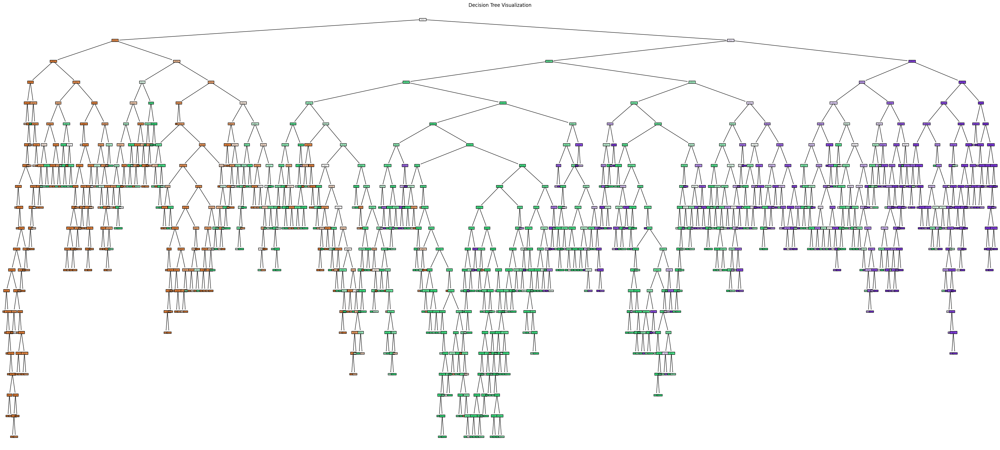

In [ ]:
#Print optimal tree result
print(f'Train Accuracy: {grid_search.score(X_train, y_train)}')
print(f'Test Accuracy: {grid_search.score(X_test, y_test)}')

from sklearn.tree import plot_tree
#visualize the best tree
# Extract the best model from GridSearchCV
best_tree= grid_search.best_estimator_

# Plot the decision tree
plt.figure(figsize=(45, 20))
plot_tree(best_tree, feature_names=X.columns, class_names=['Low Demand', 'Medium Demand', 'High Demand'], filled=True)
plt.title('Decision Tree Visualization')
plt.show()


In [ ]:
#Step 2 - Enhancing Feature Selections using Recursive Feature Elimination technique
estimator = DecisionTreeClassifier(max_depth=20, min_samples_leaf=10, min_samples_split=2, random_state=42)
selector = RFE(estimator, n_features_to_select=5, step=1)
selector = selector.fit(X_train, y_train)
print("Selected features: ", X_train.columns[selector.support_])
top_features = X_train.columns[selector.support_]

scores = cross_val_score(estimator, X_train[top_features], y_train, cv=5)
print("Average accuracy with top features: ", scores.mean())



Selected features:  Index(['Central_RT_LOAD', 'MISO_DA_GAS', 'PJM_RTLOAD', 'PJM_LOAD_FC',
       'PJM_MISO_RT_LOAD'],
      dtype='object')
Average accuracy with top features:  0.9477397424437418


##Fitting Decision Tree Models with top-features - MISO

In [ ]:
#Train / Test set Splitting with commonly use 80/20 split using the top features
X2 = dataset[['Central_RT_LOAD','MISO_DA_GAS','PJM_MISO_RT_LOAD','PJM_LOAD_FC','PJM_LOAD_FC']]
y2 = dataset['MISO_Load_Category_encoded']
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.2, random_state=42)

model2 = DecisionTreeClassifier(max_depth=20, min_samples_leaf=10,
                                min_samples_split=2,random_state=42)
model2.fit(X_train2, y_train2)


#Evaluaitng model accuracy
y_pred2 = model2.predict(X_test2)
accuracy2 = accuracy_score(y_test2, y_pred2)
print(f'Model Accuracy: {accuracy2}')

from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix

#Confusion Matrix
conf_matrix = confusion_matrix(y_test2, y_pred2)
display(conf_matrix)

#Precision Score
precision = precision_score(y_test2, y_pred2, average='weighted')
print(f'Precision Score: {precision}')

#Recall Score
recall = recall_score(y_test2, y_pred2, average='weighted')
print(f'Recall Score: {recall}')




Model Accuracy: 0.9467732724157624


array([[2823,   82,    0],
       [ 141, 2702,  119],
       [   0,  124, 2764]])

Precision Score: 0.9466333510485623
Recall Score: 0.9467732724157624


##Data Splitting and Train Decision Tree Model - PJMC

Model Accuracy: 0.9679040548258139
PJM_West_LOAD: 0.7396
PJM_MISO_RT_LOAD: 0.1283
MISO_RTLOAD: 0.0924
PJM_GAS_Gen: 0.0081
PJM_Coal_Gen: 0.0028
PJM_Hydro_Gen: 0.0014
MISO_Nuclear_DA: 0.0012
MISO_Rolling_Std: 0.0011
MISO_DA_COAL: 0.0010
MISO_GAS_GEN: 0.0010
MISO_Nuclear_Gen: 0.0009
PJMC_Rolling_Std: 0.0009
MISO_COAL_GEN: 0.0009
PJM_Net_Load: 0.0009
MISO_RT_LMP: 0.0008
MISO_PJMC_RT_CONG: 0.0008
PJM_ACE: 0.0008
PJMC_DA_CONG: 0.0008
MISO_PJMC_DA_CONG: 0.0008
MISO_Rolling_Zscore: 0.0008
PJMC_RT_LMP: 0.0007
MISO_Hydro_Gen: 0.0007
MISO_Net_Load: 0.0007
MIS_DA_Hydro: 0.0007
PJM_Nuclear_Gen: 0.0007
PJMC_Rolling_Zscore: 0.0007
PJM_Ramp_Exports: 0.0007
MISO_DA_CONG: 0.0006
MISO_LMP_Diff: 0.0006
PJM_MISO_Net_Load: 0.0006
MISO_RT_CONG: 0.0006
PJM_CONG_DIFF: 0.0005
MISO_DA_GAS: 0.0005
MISO_CONG_DIFF: 0.0005
PJMC_DA_LMP: 0.0005
MISO_ACE: 0.0005
MISO_Rolling_Mean: 0.0005
Diff_FC_PJM_Load: 0.0005
PJMC_Difference: 0.0005
PJM_Net_Exports: 0.0004
PJMC_Rolling_Mean: 0.0004
MISO_PJMC_DALMP: 0.0004
MISO_PJMC_

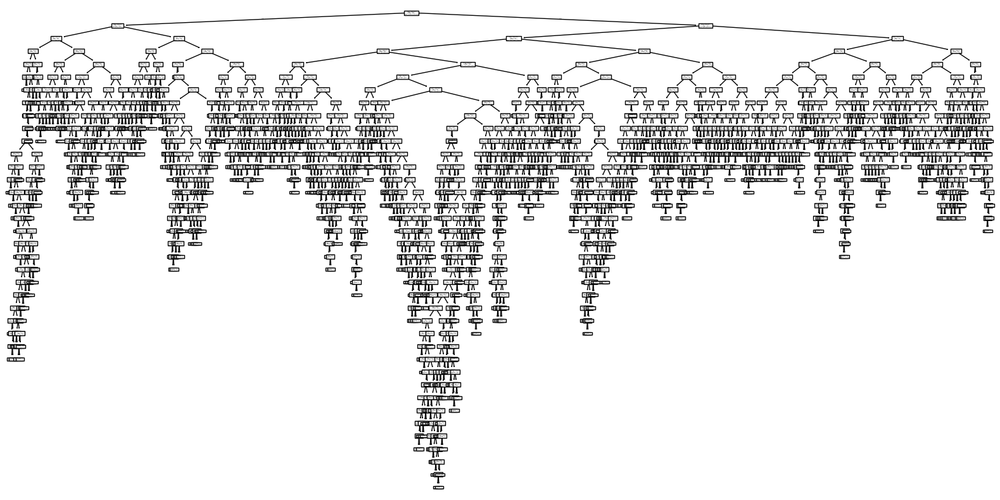

In [ ]:
#ensure no missing values in target variable
dataset = dataset.dropna(subset=['PJM_Load_Category_encoded'])

#Filter on the float columns
float_columns = dataset.select_dtypes(include=['float64'])

#Train / Test set Splitting with commonly use 80/20 split
X_PJM = float_columns.drop(['PJM_Load_Category_encoded','PJM_RTLOAD','PJM_LOAD_FC','RTLOAD','LOAD_FC',
                            'MISO_LOAD_FC','PJM_West_LOAD_FC','Central_LOAD_FC'], axis=1)
y_PJM = dataset['PJM_Load_Category_encoded']
X_train_PJM, X_test_PJM, y_train_PJM, y_test_PJM = train_test_split(X_PJM, y_PJM, test_size=0.2, random_state=1)

model_PJM = DecisionTreeClassifier(random_state=1)
model_PJM.fit(X_train_PJM, y_train_PJM)

#Model accuracy / Score -> looks nice but prob is overfitted
y_pred_PJM = model_PJM.predict(X_test_PJM)
accuracy_PJM = accuracy_score(y_test_PJM, y_pred_PJM)
print(f'Model Accuracy: {accuracy_PJM}')

#Evaluating Feature Importance
importance_PJM = model_PJM.feature_importances_
features_name_PJM = X_PJM.columns
feature_importance_dict_PJM = dict(zip(features_name_PJM, importance_PJM))
sorted_features_PJM = sorted(feature_importance_dict_PJM.items(), key=lambda x: x[1], reverse=True)

for feature_PJM, importance_PJM in sorted_features_PJM:
    print(f"{feature_PJM}: {importance_PJM:.4f}")

# Plot the decision tree to vizualize the model complexity -> Too complex
plt.figure(figsize=(20, 10))
plot_tree(model)
plt.show()

##Improving Model Performance and Fix Overfitting

In [ ]:
#Tuning the model - 2 steps

#step 1 - Find the optimal tree depth
#Grid search for optimal hyperparameters / Finding optimal tree depth
parameters_PJM = {
    'max_depth': [5,10,20],
    'min_samples_split': [2, 10,20],
    'min_samples_leaf': [1, 5,10]
}

grid_search_PJM = GridSearchCV(DecisionTreeClassifier(random_state=1), parameters_PJM, cv=5, scoring='accuracy')
grid_search_PJM.fit(X_train_PJM, y_train_PJM)

print('Best parameters:', grid_search_PJM.best_params_)


Best parameters: {'max_depth': 20, 'min_samples_leaf': 10, 'min_samples_split': 2}


Train Accuracy: 0.9858354513522004
Test Accuracy: 0.9720159908623643


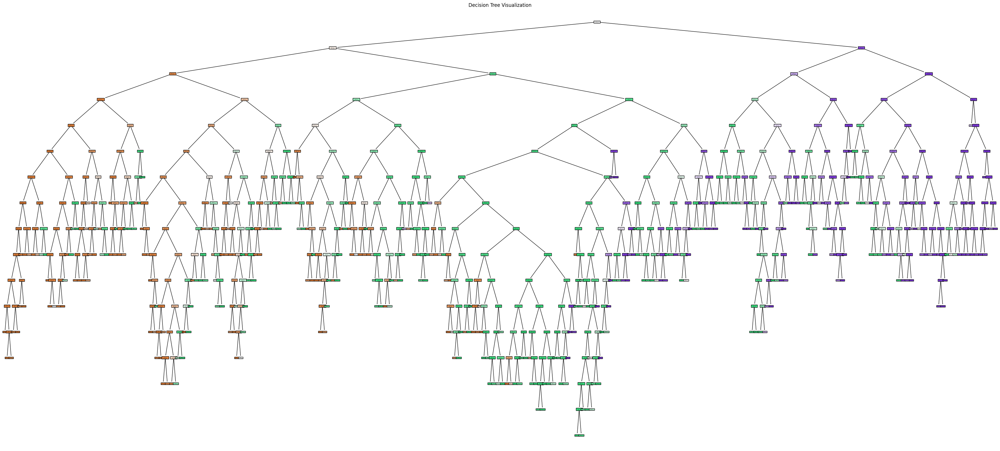

In [ ]:
#Print Optimal Tree result
print(f'Train Accuracy: {grid_search_PJM.score(X_train_PJM, y_train_PJM)}')
print(f'Test Accuracy: {grid_search_PJM.score(X_test_PJM, y_test_PJM)}')


from sklearn.tree import plot_tree


#visualize the best tree
# Extract the best model from GridSearchCV
best_tree_PJM= grid_search_PJM.best_estimator_

# Plot the decision tree
plt.figure(figsize=(45, 20))
plot_tree(best_tree_PJM, feature_names=X_PJM.columns, class_names=['Low Demand', 'Medium Demand', 'High Demand'], filled=True)
plt.title('Decision Tree Visualization')
plt.show()

In [ ]:
#Step 2 - Enhance Feature Selections with Recursive Features Elimination techniques
estimator = DecisionTreeClassifier(max_depth=20, min_samples_leaf=5, min_samples_split=2, random_state=1)
selector = RFE(estimator, n_features_to_select=5, step=1)
selector = selector.fit(X_train_PJM, y_train_PJM)
print("Selected features: ", X_train_PJM.columns[selector.support_])
top_features_PJM = X_train_PJM.columns[selector.support_]

scores = cross_val_score(estimator, X_train_PJM[top_features_PJM], y_train_PJM, cv=5)
print("Average accuracy with top features: ", scores.mean())


Selected features:  Index(['MISO_RTLOAD', 'PJM_West_LOAD', 'PJM_GAS_Gen', 'PJM_Coal_Gen',
       'PJM_MISO_RT_LOAD'],
      dtype='object')
Average accuracy with top features:  0.976440116673502


## Fitting Decision Tree models with Top Features - PJM

In [ ]:
#Train / Test set Splitting with commonly use 80/20 split using the top features
X2_PJM = dataset[['MISO_RTLOAD', 'PJM_West_LOAD', 'PJM_GAS_Gen', 'MISO_PJMC_RT_CONG','PJM_MISO_RT_LOAD']]
y2_PJM = dataset['PJM_Load_Category_encoded']
X_train2_PJM, X_test2_PJM, y_train2_PJM, y_test2_PJM = train_test_split(X2_PJM, y2_PJM, test_size=0.2, random_state=1)

model2_PJM = DecisionTreeClassifier(max_depth=20, min_samples_leaf=5, min_samples_split=2,random_state=1)
model2_PJM.fit(X_train2_PJM, y_train2_PJM)


#Evaluating Model Accuracy
y_pred2_PJM = model2_PJM.predict(X_test2_PJM)
accuracy2_PJM = accuracy_score(y_test2_PJM, y_pred2_PJM)
print(f'Model Accuracy: {accuracy2_PJM}')

#Confusion Matrix
conf_matrix_PJM = confusion_matrix(y_test2_PJM, y_pred2_PJM)
display(conf_matrix_PJM)

#Precision Score
precision_PJM = precision_score(y_test2_PJM, y_pred2_PJM, average='weighted')
print(f'Precision Score: {precision_PJM}')

#Recall Score
recall_PJM = recall_score(y_test2_PJM, y_pred2_PJM, average='weighted')
print(f'Recall Score: {recall_PJM}')

Model Accuracy: 0.9771559109080525


array([[2846,   50,    0],
       [  60, 2835,   41],
       [   0,   49, 2874]])

Precision Score: 0.9771589335545758
Recall Score: 0.9771559109080525


## Regression Modeling

### PJM market

In [ ]:
# Re-import libraries due to code execution environment reset
import pandas as pd
from pandas.plotting import scatter_matrix

# Reload the dataset
file_path = "raw_data.csv"

df = pd.read_csv(file_path)

# Display the first few rows
df.head()

,Weekday,ON/OFF,HE,DATE,Date/Time,PJMC RT LMP,PJMC RT CONG,PJMC DA LMP,PJMC DA CONG,MISO RT LMP,...,MISO ACE,PJM ACE,MISO/PJMC DALMP,MISO/PJMC RTLMP,MISO/PJMC DA CONG,MISO/PJMC RT CONG,PJM/MISO RT LOAD,MISO Net Load,PJM Net Load,PJM/MISO Net Load
0,4,OFF,1,5/30/2019,5/30/2019 01:00,21.26,0.0,20.92,0.56,17.48,...,34.52,12.10,-2.51,-3.78,-1.03,0.16,9734.33,10491.66,-4919.29,-15410.95
1,4,OFF,2,5/30/2019,5/30/2019 02:00,20.18,0.0,20.48,-0.05,18.42,...,-64.99,-47.15,-2.53,-1.76,-0.43,0.12,9242.59,11198.60,-5514.46,-16713.06
2,4,OFF,3,5/30/2019,5/30/2019 03:00,19.28,0.0,19.34,-0.21,18.60,...,22.65,47.56,-1.84,-0.68,-0.32,0.09,9026.29,12170.31,-8015.65,-20185.96
3,4,OFF,4,5/30/2019,5/30/2019 04:00,19.31,0.0,18.96,-0.12,17.67,...,39.58,77.01,-2.52,-1.64,-0.69,0.13,9120.73,11703.99,-9397.73,-21101.72
4,4,OFF,5,5/30/2019,5/30/2019 05:00,18.98,0.0,19.04,-0.17,18.43,...,69.99,48.68,-2.35,-0.55,-0.81,0.33,9842.51,11795.56,-9037.81,-20833.38


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error


In [ ]:
scatter_features = ['MISO GAS GEN', 'Congestion', 'Forecasts', 'Exports']  # Replace with actual column names

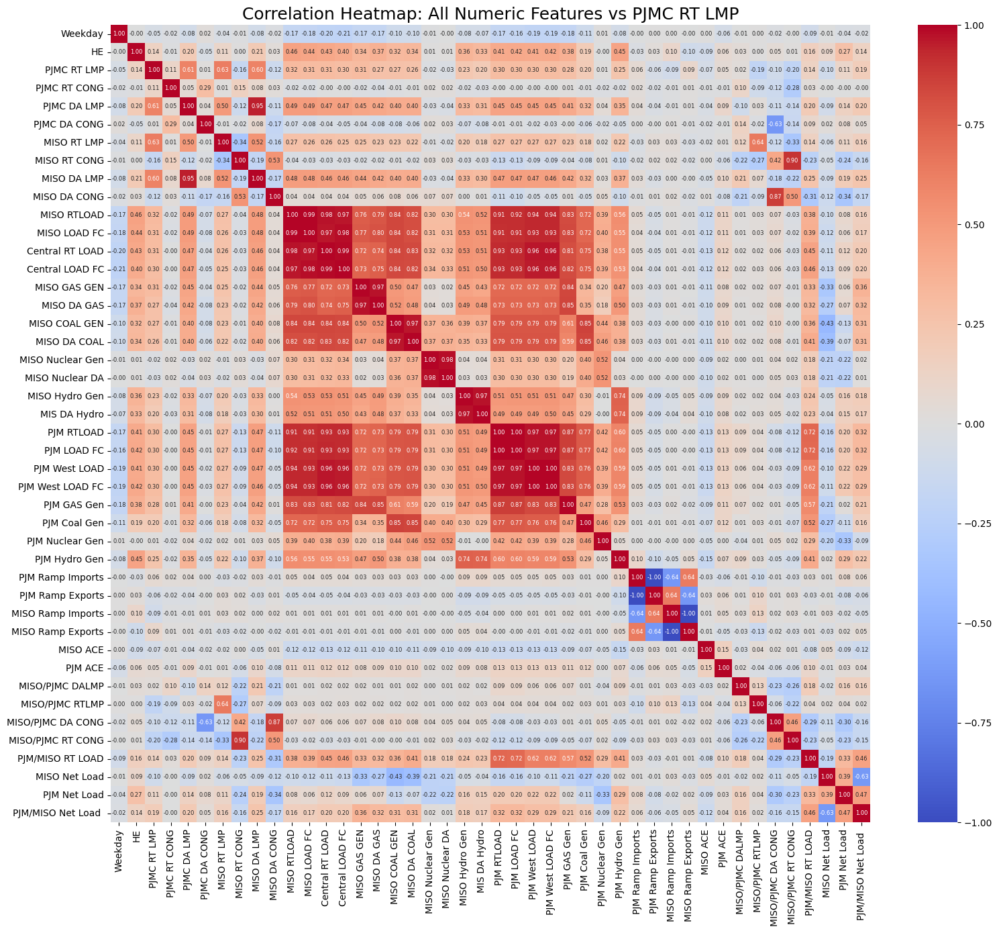

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Clean data: convert numeric-looking object columns
df_clean = df.copy()
for col in df_clean.columns:
    if df_clean[col].dtype == 'object':
        df_clean[col] = df_clean[col].str.replace(',', '', regex=False)
        try:
            df_clean[col] = df_clean[col].astype(float)
        except:
            continue  # leave as is if conversion fails

# Select numeric columns
numeric_cols = df_clean.select_dtypes(include='number').columns.tolist()

# Ensure 'PJMC RT LMP' is included
if 'PJMC RT LMP' not in numeric_cols:
    numeric_cols.insert(0, 'PJMC RT LMP')

# Subset and clean data
heatmap_df = df_clean[numeric_cols].dropna()

# Compute correlation matrix
corr_matrix = heatmap_df.corr()

# Plot heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    annot_kws={"size": 6}  # smaller font size
)
plt.title("Correlation Heatmap: All Numeric Features vs PJMC RT LMP", fontsize=18)
plt.tight_layout()
plt.show()



#Correlation matrix among the selected features

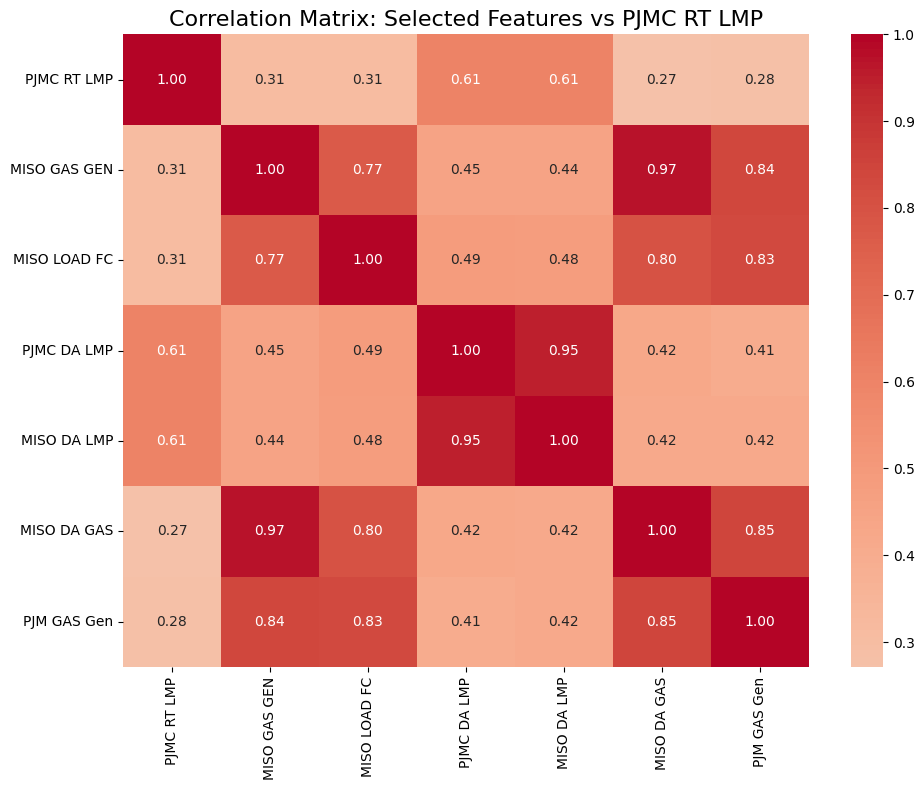

In [ ]:
import seaborn as sns

# List of selected features
selected_features = [
    'PJMC RT LMP',
    'MISO GAS GEN',
    'MISO LOAD FC',
    'PJMC DA LMP',
    'MISO DA LMP',
    'MISO DA GAS',
    'PJM GAS Gen'
]

# Create a clean copy of just the selected features
selected_df = df_clean[selected_features].dropna()

# Compute correlation matrix
corr_matrix_small = selected_df.corr()

# Plot the smaller heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_small, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Correlation Matrix: Selected Features vs PJMC RT LMP", fontsize=16)
plt.tight_layout()
plt.show()



Cleaned some features out since it is too correlated with eachother

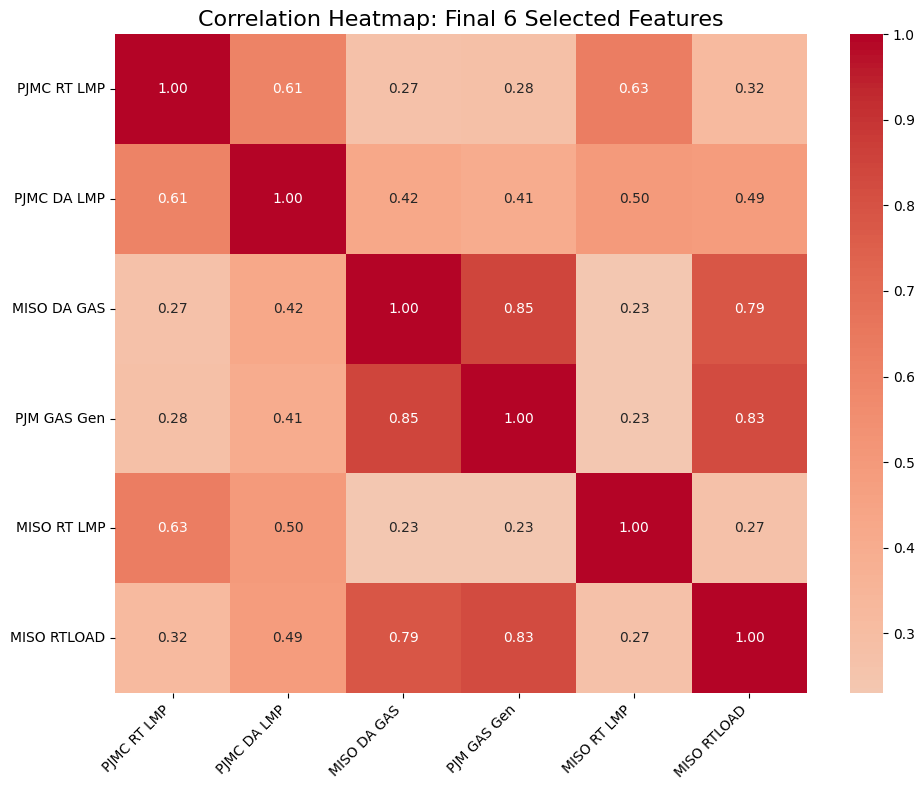

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Load the CSV file
# Replace with your actual file path

# Step 2: Define the 6 features we want to keep (based on correlation and availability)
selected_features = [
    'PJMC RT LMP',
    'PJMC DA LMP',
    'MISO DA GAS',
    'PJM GAS Gen',
    'MISO RT LMP',
    'MISO RTLOAD'
]

# Step 3: Clean numeric formatting (remove commas, convert to float)
for col in selected_features:
    df[col] = df[col].astype(str).str.replace(',', '', regex=False)
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Step 4: Drop rows with missing values in any of the selected columns
df_cleaned = df[selected_features].dropna()

# Step 5: Compute correlation matrix
corr_matrix = df_cleaned.corr()

# Step 6: Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("Correlation Heatmap: Final 6 Selected Features", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


##Training - Scaling

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Clean column names
df.columns = df.columns.str.strip()

# Define selected features and target
selected_columns = [
    'PJMC RT LMP',    # Target
    'PJMC DA LMP',
    'MISO DA GAS',
    'PJM GAS Gen',
    'MISO RT LMP',
    'MISO RTLOAD'
]

# Remove commas and convert to float
for col in selected_columns:
    df[col] = df[col].astype(str).str.replace(',', '', regex=False)
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Drop rows with missing values
selected_df = df[selected_columns].dropna()

# Define features and target
X = selected_df.drop(columns='PJMC RT LMP')
y = selected_df['PJMC RT LMP']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

# Show final shapes for verification
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((35068, 5), (8768, 5), (35068,), (8768,))

In [ ]:
# Import required models
from sklearn.svm import SVR

# Set algorithm options
num_folds = 3
seed = 42
scoring = 'neg_mean_squared_error'

# Define models list as shown in the slide
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('RIDGE', Ridge()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

# Evaluate each model using 10-fold cross-validation with negative MSE
from sklearn.model_selection import KFold
model_results = []
model_names = []

for name, model in models:
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    model_results.append(cv_results)
    model_names.append(name)

# Create a summary DataFrame
results_summary = pd.DataFrame({
    'Model': model_names,
    'Mean MSE': [-cv.mean() for cv in model_results],
    'Std Dev': [cv.std() for cv in model_results]
}).sort_values(by='Mean MSE')

# Display the results (compatible with Jupyter and regular Python)
display(results_summary)  # or use print(results_summary)


,Model,Mean MSE,Std Dev
2,RIDGE,714.543642,145.549697
0,LR,714.547024,145.548270
1,LASSO,716.364007,146.426664
3,EN,743.441228,166.421043
4,KNN,820.913867,176.402464
6,SVR,921.325904,229.188377
5,CART,1124.843458,146.993278


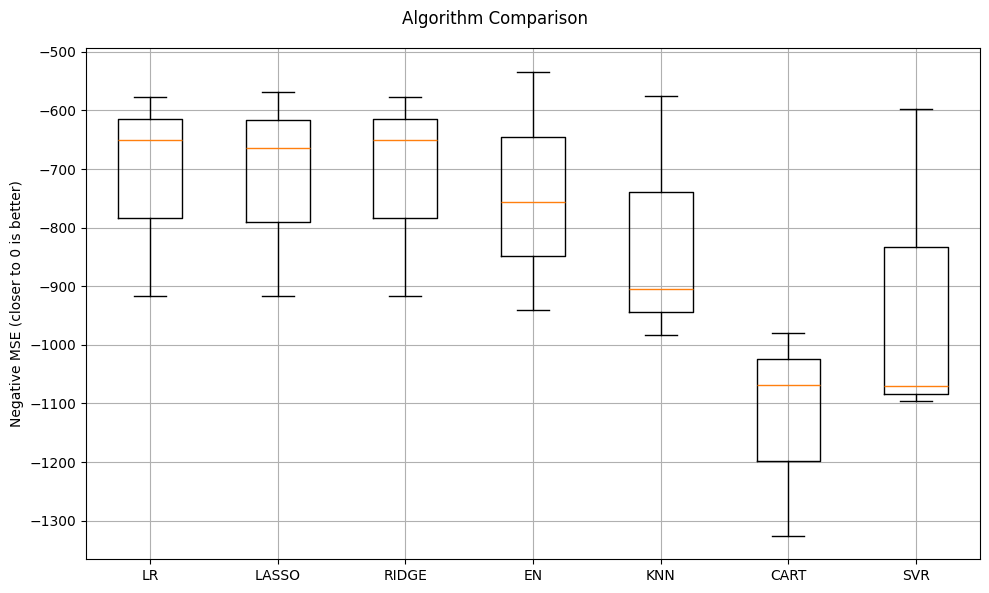

In [ ]:
import matplotlib.pyplot as plt

# Create boxplot comparison of the models using cross-validation results
fig = plt.figure(figsize=(10, 6))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(model_results)
ax.set_xticklabels(model_names)
plt.ylabel('Negative MSE (closer to 0 is better)')
plt.grid(True)
plt.tight_layout()
plt.show()


#KNN Alg KNN Hyperparameter Tuning (Grid Search)


In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV, KFold
import matplotlib.pyplot as plt

# 1. Define the parameter grid (values of k to try)
k_values = list(range(1, 21))
param_grid = {'n_neighbors': k_values}

# 2. Set up K-Fold cross-validation
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)

# 3. Set up Grid Search with KNN
model = KNeighborsRegressor()
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)

# 4. Fit on training data
grid_result = grid.fit(X_train, y_train)  # Or use X_scaled if you're scaling

# 5. Print best score and params
print("Best MSE: %f using K = %s" % (-grid_result.best_score_, grid_result.best_params_['n_neighbors']))


Best MSE: 736.757284 using K = 12


In [ ]:
# 6. Extract mean & std for each tested k
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']

for mean, std, param in zip(means, stds, params):
    print(" K = %d --> MSE = %.3f (± %.3f)" % (param['n_neighbors'], -mean, std))


 K = 1 --> MSE = 1310.916 (± 154.568)
 K = 2 --> MSE = 975.948 (± 140.825)
 K = 3 --> MSE = 878.078 (± 184.668)
 K = 4 --> MSE = 838.406 (± 167.521)
 K = 5 --> MSE = 820.914 (± 176.402)
 K = 6 --> MSE = 809.538 (± 160.587)
 K = 7 --> MSE = 800.965 (± 148.541)
 K = 8 --> MSE = 782.372 (± 149.549)
 K = 9 --> MSE = 758.831 (± 149.485)
 K = 10 --> MSE = 744.600 (± 141.776)
 K = 11 --> MSE = 740.928 (± 148.216)
 K = 12 --> MSE = 736.757 (± 152.987)
 K = 13 --> MSE = 741.385 (± 162.271)
 K = 14 --> MSE = 741.964 (± 168.845)
 K = 15 --> MSE = 741.494 (± 171.229)
 K = 16 --> MSE = 744.538 (± 174.037)
 K = 17 --> MSE = 746.065 (± 175.885)
 K = 18 --> MSE = 743.098 (± 173.489)
 K = 19 --> MSE = 743.291 (± 176.283)
 K = 20 --> MSE = 743.041 (± 178.305)


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor

# 1. Rescale training data
scaler = StandardScaler().fit(X_train)
rescaledX_train = scaler.transform(X_train)

# 2. Get best k from GridSearchCV
best_k = grid_result.best_params_['n_neighbors']

# 3. Train final KNN model with best k
model = KNeighborsRegressor(n_neighbors=best_k)
model.fit(rescaledX_train, y_train)

# 4. Rescale the test set using the same scaler
rescaledX_test = scaler.transform(X_test)

# 5. Predict on test data
estimates = model.predict(rescaledX_test)

# 6. Evaluate the model
print("Predictions:", estimates[:10])
print("Actual:", y_test[:10].values)  # assuming y_test is a pandas Series
print("Test MSE:", mean_squared_error(y_test, estimates))

Predictions: [43.825      37.48666667 23.54       42.98083333 19.12       23.54666667
 56.86916667 22.78666667 23.87916667 40.2075    ]
Actual: [ 36.46  42.18  22.73  36.31  23.18 246.69  49.    21.89  23.06  25.55]
Test MSE: 515.1192034818848


### MISO Market

In [ ]:
# Re-import libraries due to code execution environment reset
import pandas as pd
from pandas.plotting import scatter_matrix

# Reload the dataset
file_path = "raw_data.csv"
df = pd.read_csv(file_path)

# Display the first few rows
df.head()

,Weekday,ON/OFF,HE,DATE,Date/Time,PJMC RT LMP,PJMC RT CONG,PJMC DA LMP,PJMC DA CONG,MISO RT LMP,...,MISO ACE,PJM ACE,MISO/PJMC DALMP,MISO/PJMC RTLMP,MISO/PJMC DA CONG,MISO/PJMC RT CONG,PJM/MISO RT LOAD,MISO Net Load,PJM Net Load,PJM/MISO Net Load
0,4,OFF,1,5/30/2019,5/30/2019 01:00,21.26,0.0,20.92,0.56,17.48,...,34.52,12.10,-2.51,-3.78,-1.03,0.16,9734.33,10491.66,-4919.29,-15410.95
1,4,OFF,2,5/30/2019,5/30/2019 02:00,20.18,0.0,20.48,-0.05,18.42,...,-64.99,-47.15,-2.53,-1.76,-0.43,0.12,9242.59,11198.60,-5514.46,-16713.06
2,4,OFF,3,5/30/2019,5/30/2019 03:00,19.28,0.0,19.34,-0.21,18.60,...,22.65,47.56,-1.84,-0.68,-0.32,0.09,9026.29,12170.31,-8015.65,-20185.96
3,4,OFF,4,5/30/2019,5/30/2019 04:00,19.31,0.0,18.96,-0.12,17.67,...,39.58,77.01,-2.52,-1.64,-0.69,0.13,9120.73,11703.99,-9397.73,-21101.72
4,4,OFF,5,5/30/2019,5/30/2019 05:00,18.98,0.0,19.04,-0.17,18.43,...,69.99,48.68,-2.35,-0.55,-0.81,0.33,9842.51,11795.56,-9037.81,-20833.38


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error

In [ ]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

# Select features to include in scatter plot matrix
scatter_features = [
    'MISO RT LMP',  # Target

    # Congestion
    'PJMC RT CONG', 'PJMC DA CONG', 'MISO RT CONG', 'MISO DA CONG',
    'MISO/PJMC RT CONG', 'MISO/PJMC DA CONG',

    # Load Forecasts
    'PJM LOAD FC', 'MISO LOAD FC', 'PJM West LOAD FC', 'Central LOAD FC',

    # Generation by Type
    'PJM GAS Gen', 'PJM Coal Gen', 'PJM Nuclear Gen', 'PJM Hydro Gen',
    'MISO GAS GEN', 'MISO COAL GEN', 'MISO Nuclear Gen', 'MISO Hydro Gen',

    # Imports/Exports
    'PJM Ramp Imports', 'PJM Ramp Exports', 'MISO Ramp Imports', 'MISO Ramp Exports',

    # Grid Stability
    'PJM ACE', 'MISO ACE'
]

# Drop rows with missing values for just the columns we need
scatter_data = df[scatter_features].dropna()


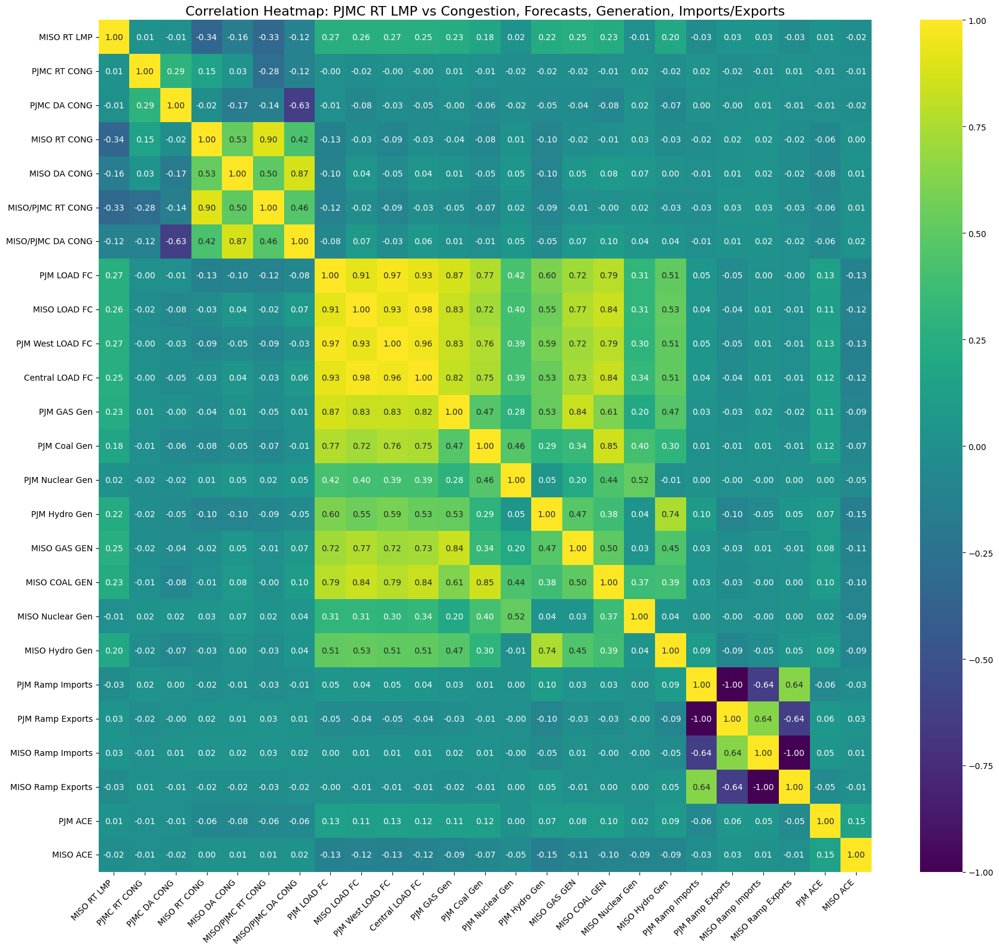

In [ ]:
import seaborn as sns

# Clean comma-containing columns in scatter_features if necessary
for col in scatter_features:
    if df[col].dtype == 'object':
        df[col] = df[col].str.replace(',', '', regex=False).astype(float)

# Drop rows with missing values for selected features
heatmap_data = df[scatter_features].dropna()

# Compute correlation matrix
corr_matrix = heatmap_data.corr()

# Plot heatmap
plt.figure(figsize=(18, 16))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="viridis", center=0)
plt.title("Correlation Heatmap: PJMC RT LMP vs Congestion, Forecasts, Generation, Imports/Exports", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

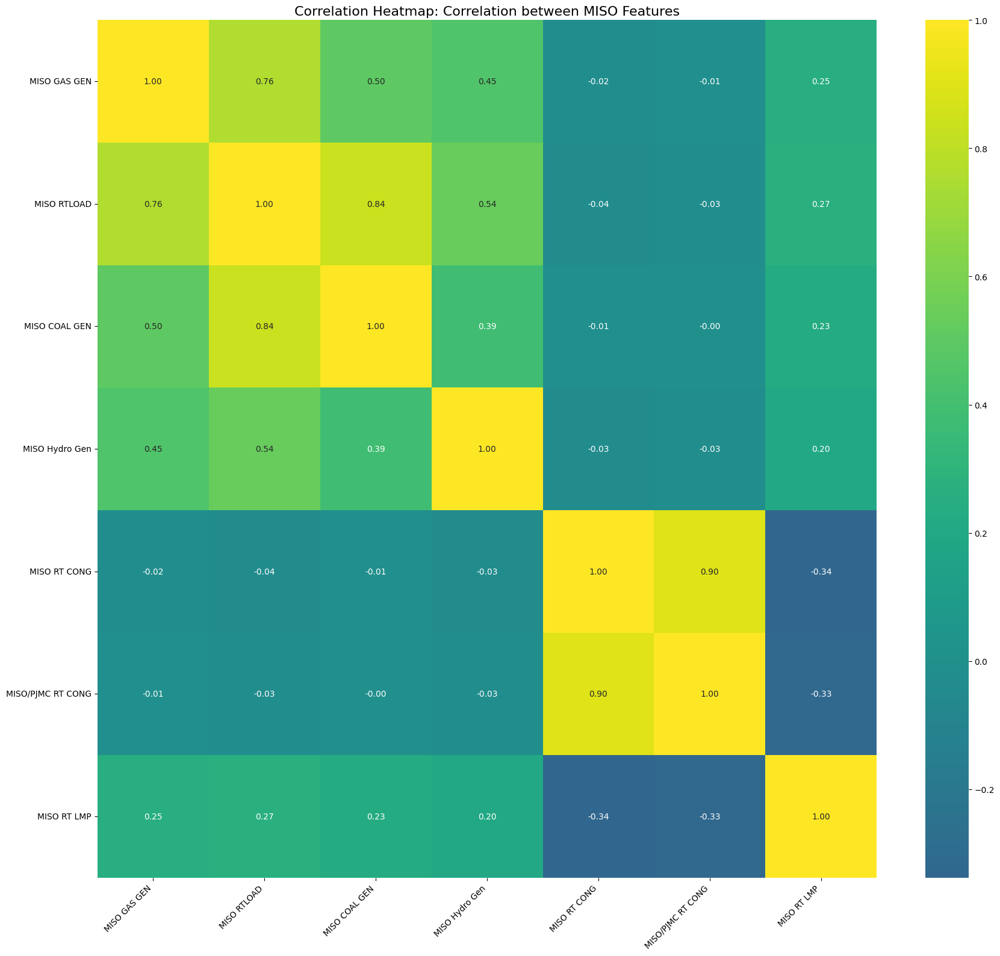

In [ ]:
selected_columns = [
    'MISO GAS GEN',
    'MISO RTLOAD',
    'MISO COAL GEN',
    'MISO Hydro Gen',
    'MISO RT CONG',
    'MISO/PJMC RT CONG',
    'MISO RT LMP'  # Target
]
heatmap_data2 = df[selected_columns]
# Compute correlation matrix
corr_matrix2 = heatmap_data2.corr()

# Plot heatmap
plt.figure(figsize=(18, 16))
sns.heatmap(corr_matrix2, annot=True, fmt=".2f", cmap="viridis", center=0)
plt.title("Correlation Heatmap: Correlation between MISO Features", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Training - Scaling

In [ ]:
# Clean column names
df.columns = df.columns.str.strip()

# Define selected features and target
selected_columns = [
    'MISO GAS GEN',
    'MISO RTLOAD',
    'MISO COAL GEN',
    'MISO Hydro Gen',
    'MISO RT CONG',
    'MISO/PJMC RT CONG',
    'MISO RT LMP'  # Target
]
# Remove commas and convert to float
for col in selected_columns:
    df[col] = df[col].astype(str).str.replace(',', '').astype(float)

# Drop rows with missing values
selected_df = df[selected_columns].dropna()

# Define features and target
X = selected_df.drop(columns='MISO RT LMP')
y = selected_df['MISO RT LMP']

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42
)

# Show final shapes for verification
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((35076, 6), (8769, 6), (35076,), (8769,))

In [ ]:
# Import required models
from sklearn.svm import SVR

# Set algorithm options
num_folds = 3
seed = 42
scoring = 'neg_mean_squared_error'

# Define models list as shown in the slide
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('RIDGE', Ridge()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

# Evaluate each model using 10-fold cross-validation with negative MSE
from sklearn.model_selection import KFold
model_results = []
model_names = []

for name, model in models:
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    model_results.append(cv_results)
    model_names.append(name)

# Create a summary DataFrame
results_summary = pd.DataFrame({
    'Model': model_names,
    'Mean MSE': [-cv.mean() for cv in model_results],
    'Std Dev': [cv.std() for cv in model_results]
}).sort_values(by='Mean MSE')

# Display the results (compatible with Jupyter and regular Python)
display(results_summary)  # or use print(results_summary)


,Model,Mean MSE,Std Dev
4,KNN,1227.924144,132.195130
2,RIDGE,1446.108908,72.277232
0,LR,1446.112129,72.282020
1,LASSO,1450.388369,60.876695
3,EN,1455.939756,37.616074
6,SVR,1511.405925,27.970168
5,CART,2423.083403,657.502371


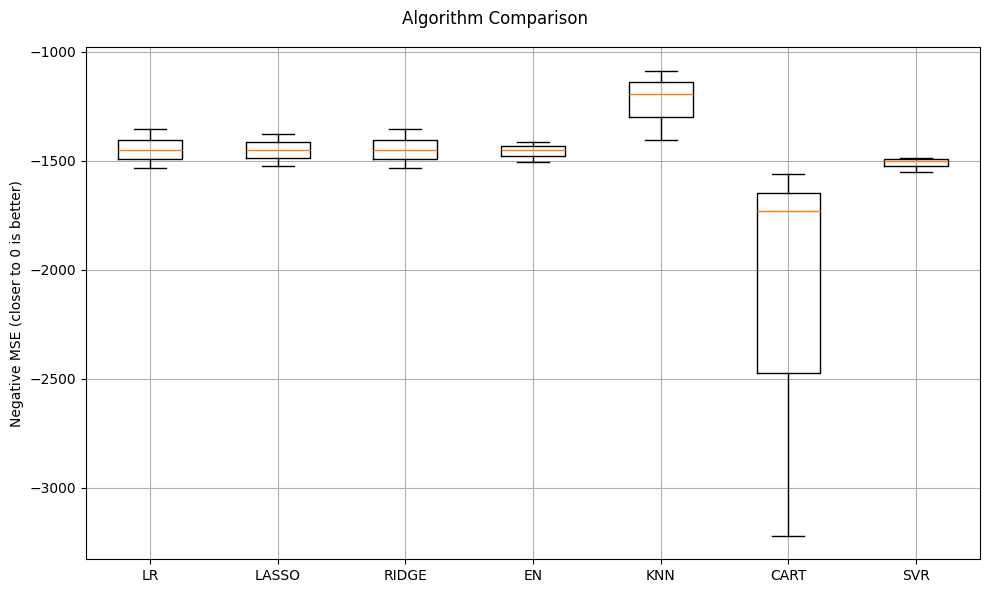

In [ ]:
import matplotlib.pyplot as plt

# Create boxplot comparison of the models using cross-validation results
fig = plt.figure(figsize=(10, 6))
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(model_results)
ax.set_xticklabels(model_names)
plt.ylabel('Negative MSE (closer to 0 is better)')
plt.grid(True)
plt.tight_layout()
plt.show()

KNN Alg KNN Hyperparameter Tuning (Grid Search)

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV, KFold
import matplotlib.pyplot as plt

# 1. Define the parameter grid (values of k to try)
k_values = list(range(1, 21))
param_grid = {'n_neighbors': k_values}

# 2. Set up K-Fold cross-validation
kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)

# 3. Set up Grid Search with KNN
model = KNeighborsRegressor()
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scoring, cv=kfold)

# 4. Fit on training data
grid_result = grid.fit(X_train, y_train)

# 5. Print best score and params
print("Best MSE: %f using K = %s" % (-grid_result.best_score_, grid_result.best_params_['n_neighbors']))


Best MSE: 1152.509952 using K = 16


In [ ]:
# 6. Extract mean & std for each tested k
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']

for mean, std, param in zip(means, stds, params):
    print(" K = %d --> MSE = %.3f (± %.3f)" % (param['n_neighbors'], -mean, std))


 K = 1 --> MSE = 1498.405 (± 39.328)
 K = 2 --> MSE = 1315.413 (± 69.153)
 K = 3 --> MSE = 1274.364 (± 98.171)
 K = 4 --> MSE = 1248.860 (± 140.474)
 K = 5 --> MSE = 1227.924 (± 132.195)
 K = 6 --> MSE = 1206.860 (± 110.432)
 K = 7 --> MSE = 1176.634 (± 83.521)
 K = 8 --> MSE = 1170.917 (± 73.765)
 K = 9 --> MSE = 1159.315 (± 43.336)
 K = 10 --> MSE = 1179.767 (± 40.979)
 K = 11 --> MSE = 1179.693 (± 45.347)
 K = 12 --> MSE = 1155.918 (± 82.686)
 K = 13 --> MSE = 1160.046 (± 71.738)
 K = 14 --> MSE = 1167.593 (± 67.885)
 K = 15 --> MSE = 1172.079 (± 71.245)
 K = 16 --> MSE = 1152.510 (± 89.886)
 K = 17 --> MSE = 1160.926 (± 83.100)
 K = 18 --> MSE = 1156.934 (± 61.338)
 K = 19 --> MSE = 1162.990 (± 56.295)
 K = 20 --> MSE = 1166.408 (± 56.754)


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor

# 1. Rescale training data
scaler = StandardScaler().fit(X_train)
rescaledX_train = scaler.transform(X_train)

# 2. Get best k from GridSearchCV
best_k = grid_result.best_params_['n_neighbors']

# 3. Train final KNN model with best k
model = KNeighborsRegressor(n_neighbors=best_k)
model.fit(rescaledX_train, y_train)

# 4. Rescale the test set using the same scaler
rescaledX_test = scaler.transform(X_test)

# 5. Predict on test data
estimates = model.predict(rescaledX_test)

# 6. Evaluate the model
print("Predictions:", estimates[:10])
print("Actual:", y_test[:10].values)  # assuming y_test is a pandas Series
print("Test MSE:", mean_squared_error(y_test, estimates))

Predictions: [21.9175   35.431875 26.139375 20.675625 46.29625  45.7975   27.97875
 26.835625 15.3775   34.8325  ]
Actual: [21.04 20.62 18.48 14.78 48.82 52.19 27.58 25.23 14.77 35.97]
Test MSE: 2770.7568461157116
